<a href="https://colab.research.google.com/github/Mayar215999/data-science-project/blob/main/IBM_DATA_ANALYSIS_MODULE_4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>



**Data Visualization**



In [1]:
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/n01PQ9pSmiRX6520flujwQ/survey-data.csv

--2025-02-21 20:18:43--  https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/n01PQ9pSmiRX6520flujwQ/survey-data.csv
Resolving cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)... 169.45.118.108
Connecting to cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)|169.45.118.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 159525875 (152M) [text/csv]
Saving to: ‘survey-data.csv’

survey-data.csv     100%[===================>] 152.13M  29.4MB/s    in 5.6s    

2025-02-21 20:18:50 (27.2 MB/s) - ‘survey-data.csv’ saved [159525875/159525875]



In [2]:
!pip install pandas
!pip install matplotlib

import pandas as pd
import matplotlib.pyplot as plt

In [3]:
# Read the CSV file
df = pd.read_csv('survey-data.csv')

# Display the first few rows of the data
df.head()

,ResponseId,MainBranch,Age,Employment,RemoteWork,Check,CodingActivities,EdLevel,LearnCode,LearnCodeOnline,...,JobSatPoints_6,JobSatPoints_7,JobSatPoints_8,JobSatPoints_9,JobSatPoints_10,JobSatPoints_11,SurveyLength,SurveyEase,ConvertedCompYearly,JobSat
0,1,I am a developer by profession,Under 18 years old,"Employed, full-time",Remote,Apples,Hobby,Primary/elementary school,Books / Physical media,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,I am a developer by profession,35-44 years old,"Employed, full-time",Remote,Apples,Hobby;Contribute to open-source projects;Other...,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",Books / Physical media;Colleague;On the job tr...,Technical documentation;Blogs;Books;Written Tu...,...,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN
2,3,I am a developer by profession,45-54 years old,"Employed, full-time",Remote,Apples,Hobby;Contribute to open-source projects;Other...,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)",Books / Physical media;Colleague;On the job tr...,Technical documentation;Blogs;Books;Written Tu...,...,NaN,NaN,NaN,NaN,NaN,NaN,Appropriate in length,Easy,NaN,NaN
3,4,I am learning to code,18-24 years old,"Student, full-time",NaN,Apples,NaN,Some college/university study without earning ...,"Other online resources (e.g., videos, blogs, f...",Stack Overflow;How-to videos;Interactive tutorial,...,NaN,NaN,NaN,NaN,NaN,NaN,Too long,Easy,NaN,NaN
4,5,I am a developer by profession,18-24 years old,"Student, full-time",NaN,Apples,NaN,"Secondary school (e.g. American high school, G...","Other online resources (e.g., videos, blogs, f...",Technical documentation;Blogs;Written Tutorial...,...,NaN,NaN,NaN,NaN,NaN,NaN,Too short,Easy,NaN,NaN


In [4]:
import sqlite3

# Create a connection to the SQLite database
conn = sqlite3.connect('survey-data.sqlite')

# Write the dataframe to the SQLite database
df.to_sql('main', conn, if_exists='replace', index=False)


# Close the connection
conn.close()

In [5]:
# Reconnect to the SQLite database
conn = sqlite3.connect('survey-data.sqlite')

# Run a simple query to check the data
QUERY = "SELECT * FROM main LIMIT 5"
df_check = pd.read_sql_query(QUERY, conn)

# Display the results
print(df_check)

   ResponseId                      MainBranch                 Age  \
0           1  I am a developer by profession  Under 18 years old   
1           2  I am a developer by profession     35-44 years old   
2           3  I am a developer by profession     45-54 years old   
3           4           I am learning to code     18-24 years old   
4           5  I am a developer by profession     18-24 years old   

            Employment RemoteWork   Check  \
0  Employed, full-time     Remote  Apples   
1  Employed, full-time     Remote  Apples   
2  Employed, full-time     Remote  Apples   
3   Student, full-time       None  Apples   
4   Student, full-time       None  Apples   

                                    CodingActivities  \
0                                              Hobby   
1  Hobby;Contribute to open-source projects;Other...   
2  Hobby;Contribute to open-source projects;Other...   
3                                               None   
4                                 

In [6]:
QUERY = """
SELECT COUNT(*)
FROM main
"""
df = pd.read_sql_query(QUERY, conn)
df.head()

,COUNT(*)
0,65437


In [7]:
QUERY = """
SELECT name as Table_Name FROM sqlite_master
WHERE type = 'table'
"""
pd.read_sql_query(QUERY, conn)

,Table_Name
0,main


In [8]:
QUERY = """
SELECT Age, COUNT(*) as count
FROM main
GROUP BY Age
ORDER BY Age
"""
pd.read_sql_query(QUERY, conn)

,Age,count
0,18-24 years old,14098
1,25-34 years old,23911
2,35-44 years old,14942
3,45-54 years old,6249
4,55-64 years old,2575
5,65 years or older,772
6,Prefer not to say,322
7,Under 18 years old,2568


In [9]:
table_name = 'main'

QUERY = """
SELECT sql FROM sqlite_master
WHERE name= '{}'
""".format(table_name)

df = pd.read_sql_query(QUERY, conn)
print(df.iat[0,0])

CREATE TABLE "main" (
"ResponseId" INTEGER,
  "MainBranch" TEXT,
  "Age" TEXT,
  "Employment" TEXT,
  "RemoteWork" TEXT,
  "Check" TEXT,
  "CodingActivities" TEXT,
  "EdLevel" TEXT,
  "LearnCode" TEXT,
  "LearnCodeOnline" TEXT,
  "TechDoc" TEXT,
  "YearsCode" TEXT,
  "YearsCodePro" TEXT,
  "DevType" TEXT,
  "OrgSize" TEXT,
  "PurchaseInfluence" TEXT,
  "BuyNewTool" TEXT,
  "BuildvsBuy" TEXT,
  "TechEndorse" TEXT,
  "Country" TEXT,
  "Currency" TEXT,
  "CompTotal" REAL,
  "LanguageHaveWorkedWith" TEXT,
  "LanguageWantToWorkWith" TEXT,
  "LanguageAdmired" TEXT,
  "DatabaseHaveWorkedWith" TEXT,
  "DatabaseWantToWorkWith" TEXT,
  "DatabaseAdmired" TEXT,
  "PlatformHaveWorkedWith" TEXT,
  "PlatformWantToWorkWith" TEXT,
  "PlatformAdmired" TEXT,
  "WebframeHaveWorkedWith" TEXT,
  "WebframeWantToWorkWith" TEXT,
  "WebframeAdmired" TEXT,
  "EmbeddedHaveWorkedWith" TEXT,
  "EmbeddedWantToWorkWith" TEXT,
  "EmbeddedAdmired" TEXT,
  "MiscTechHaveWorkedWith" TEXT,
  "MiscTechWantToWorkWith" TEXT,


In [10]:
QUERY = """
SELECT CompTotal
FROM main
"""
comp_total_data = pd.read_sql_query(QUERY, conn)

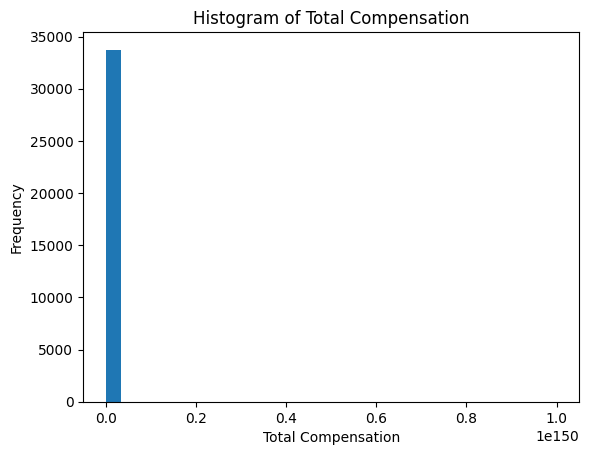

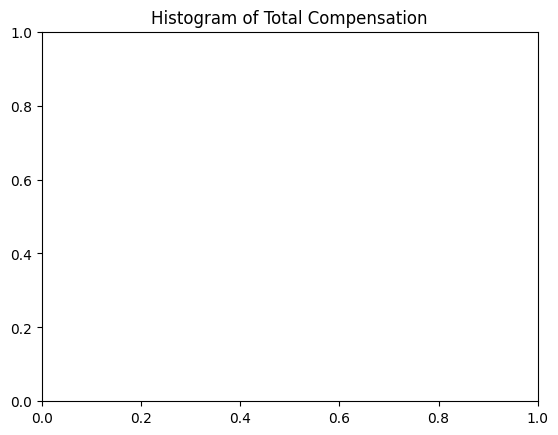

In [15]:
plt.hist(comp_total_data['CompTotal'], bins=30)  # Adjust bins as needed
plt.xlabel('Total Compensation')
plt.ylabel('Frequency')
plt.title('Histogram of Total Compensation')
plt.show()
plt.title('Histogram of Total Compensation')
plt.show()

In [16]:
QUERY = """
SELECT Age
FROM main
"""
age_data = pd.read_sql_query(QUERY, conn)

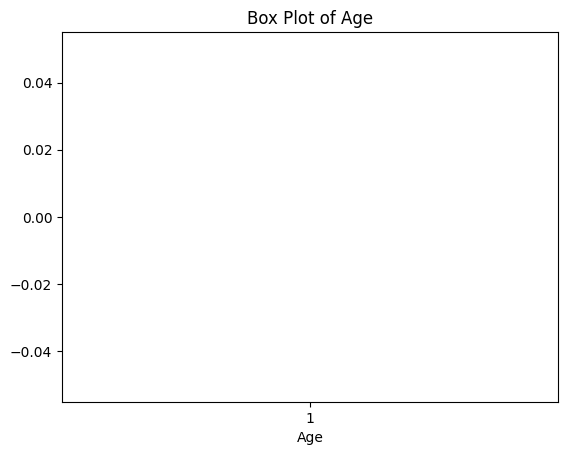

In [18]:
# Convert 'Age' column to numeric, handling non-numeric values
age_data['Age'] = pd.to_numeric(age_data['Age'], errors='coerce')

# Drop rows with NaN values (introduced by 'coerce')
age_data = age_data.dropna()

# Create the box plot
plt.boxplot(age_data['Age'])
plt.xlabel('Age')
plt.title('Box Plot of Age')
plt.show()

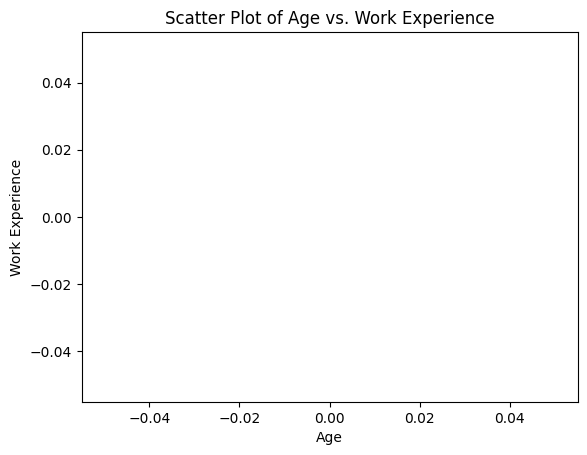

In [19]:
import pandas as pd
import matplotlib.pyplot as plt
import sqlite3

# Reconnect to the SQLite database
conn = sqlite3.connect('survey-data.sqlite')

# Query to select Age and WorkExp
QUERY = """
SELECT Age, WorkExp
FROM main
"""
scatter_data = pd.read_sql_query(QUERY, conn)

# Convert 'Age' and 'WorkExp' columns to numeric, handling errors
scatter_data['Age'] = pd.to_numeric(scatter_data['Age'], errors='coerce')
scatter_data['WorkExp'] = pd.to_numeric(scatter_data['WorkExp'], errors='coerce')

# Drop rows with NaN values
scatter_data = scatter_data.dropna()

# Create the scatter plot
plt.scatter(scatter_data['Age'], scatter_data['WorkExp'])
plt.xlabel('Age')
plt.ylabel('Work Experience')
plt.title('Scatter Plot of Age vs. Work Experience')
plt.show()

# Close the connection (optional, good practice)
conn.close()

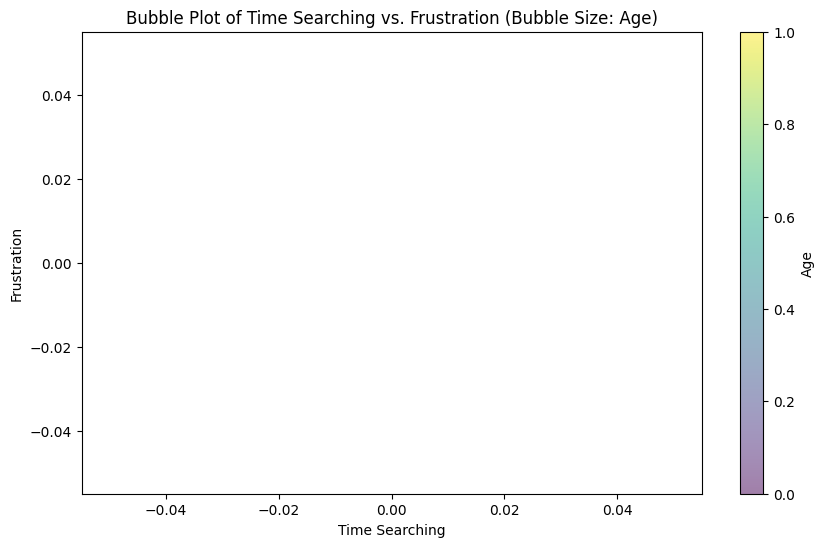

In [20]:
import pandas as pd
import matplotlib.pyplot as plt
import sqlite3
import numpy as np  # Import numpy for handling NaN values

# Reconnect to the SQLite database
conn = sqlite3.connect('survey-data.sqlite')

# Query to select TimeSearching, Frustration, and Age
QUERY = """
SELECT TimeSearching, Frustration, Age
FROM main
"""
bubble_data = pd.read_sql_query(QUERY, conn)

# Convert columns to numeric, handling errors
bubble_data['TimeSearching'] = pd.to_numeric(bubble_data['TimeSearching'], errors='coerce')
bubble_data['Frustration'] = pd.to_numeric(bubble_data['Frustration'], errors='coerce')
bubble_data['Age'] = pd.to_numeric(bubble_data['Age'], errors='coerce')

# Drop rows with NaN values in any of the columns
bubble_data = bubble_data.dropna()

# Create the bubble plot
plt.figure(figsize=(10, 6))  # Adjust figure size if needed
plt.scatter(bubble_data['TimeSearching'], bubble_data['Frustration'],
            s=bubble_data['Age'] * 10,  # Adjust bubble size scaling as needed
            alpha=0.5)  # Adjust alpha for transparency

plt.xlabel('Time Searching')
plt.ylabel('Frustration')
plt.title('Bubble Plot of Time Searching vs. Frustration (Bubble Size: Age)')
plt.colorbar(label='Age')  # Add a colorbar to represent bubble size
plt.show()

# Close the connection (optional)
conn.close()

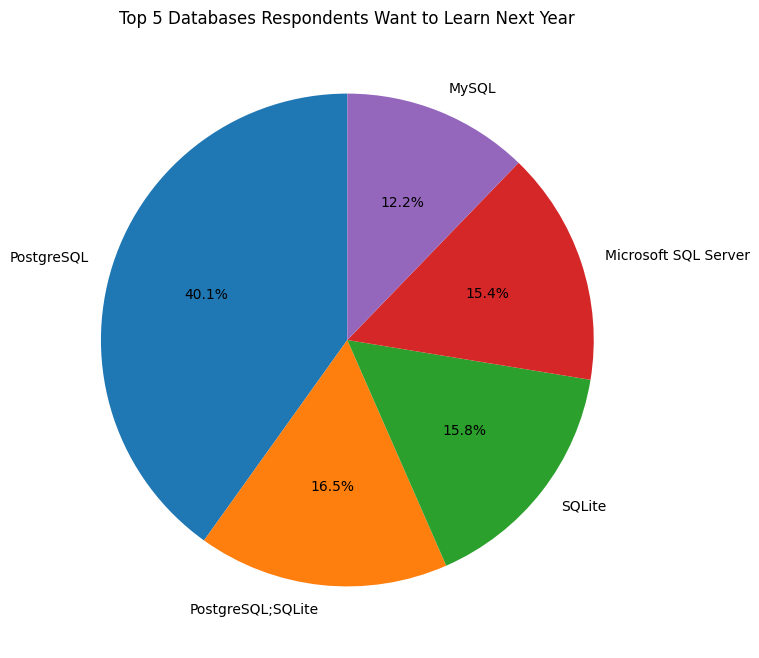

In [22]:
import pandas as pd
import matplotlib.pyplot as plt
import sqlite3

# Reconnect to the SQLite database
conn = sqlite3.connect('survey-data.sqlite')

# Query to get the top 5 databases
QUERY = """
SELECT DatabaseWantToWorkWith, COUNT(*) AS Count
FROM main
WHERE DatabaseWantToWorkWith IS NOT NULL
GROUP BY DatabaseWantToWorkWith
ORDER BY Count DESC
LIMIT 5
"""

# Read data into a DataFrame
df_pie = pd.read_sql_query(QUERY, conn)

# Create the pie chart
plt.figure(figsize=(8, 8))  # Adjust figure size if needed
plt.pie(df_pie['Count'], labels=df_pie['DatabaseWantToWorkWith'], autopct='%1.1f%%', startangle=90)
plt.title('Top 5 Databases Respondents Want to Learn Next Year')
plt.show()

# Close the connection (optional)
conn.close()

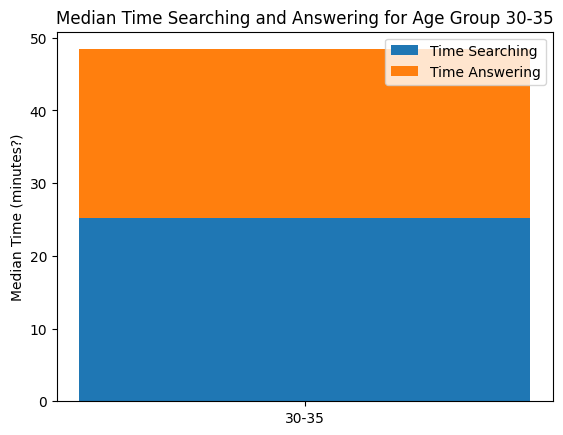

In [23]:
import pandas as pd
import matplotlib.pyplot as plt
import sqlite3
import numpy as np

# Connect to the SQLite database
conn = sqlite3.connect('survey-data.sqlite')

# SQL query to get median TimeSearching and TimeAnswering for the age group 30 to 35
QUERY = """
SELECT
    AVG(CAST(TimeSearching AS REAL)) AS MedianTimeSearching,  -- Calculate median as average due to potential non-numeric values
    AVG(CAST(TimeAnswering AS REAL)) AS MedianTimeAnswering   -- Calculate median as average due to potential non-numeric values
FROM main
WHERE CAST(Age AS REAL) BETWEEN 30 AND 35;  -- Filter for the age group 30 to 35
"""

# Read data into a DataFrame
stacked_data = pd.read_sql_query(QUERY, conn)

# Create the stacked bar chart
labels = ['30-35']  # Label for the age group
searching_time = stacked_data['MedianTimeSearching'][0]
answering_time = stacked_data['MedianTimeAnswering'][0]

plt.bar(labels, searching_time, label='Time Searching')
plt.bar(labels, answering_time, bottom=searching_time, label='Time Answering')  # Stack on top of searching time

plt.ylabel('Median Time (minutes?)')  # Assuming time is in minutes, adjust if needed
plt.title('Median Time Searching and Answering for Age Group 30-35')
plt.legend()
plt.show()

# Close the connection (optional)
conn.close()

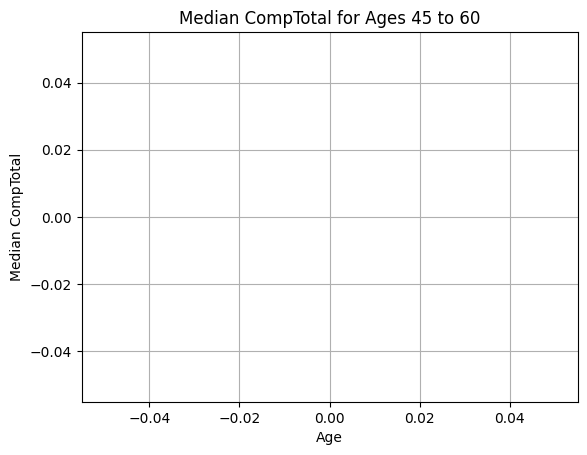

In [24]:
import pandas as pd
import matplotlib.pyplot as plt
import sqlite3

# Connect to the SQLite database
conn = sqlite3.connect('survey-data.sqlite')

# SQL query to get median CompTotal for ages 45 to 60
QUERY = """
SELECT Age, AVG(CAST(CompTotal AS REAL)) AS MedianCompTotal
FROM main
WHERE CAST(Age AS REAL) BETWEEN 45 AND 60
GROUP BY Age
ORDER BY Age
"""

# Read data into a DataFrame
median_comp_data = pd.read_sql_query(QUERY, conn)

# Convert 'Age' column to numeric, handling errors
median_comp_data['Age'] = pd.to_numeric(median_comp_data['Age'], errors='coerce')

# Drop rows with NaN values in 'Age'
median_comp_data = median_comp_data.dropna(subset=['Age'])

# Create the line chart
plt.plot(median_comp_data['Age'], median_comp_data['MedianCompTotal'])
plt.xlabel('Age')
plt.ylabel('Median CompTotal')
plt.title('Median CompTotal for Ages 45 to 60')
plt.grid(True)  # Add grid for better readability
plt.show()

# Close the connection (optional)
conn.close()

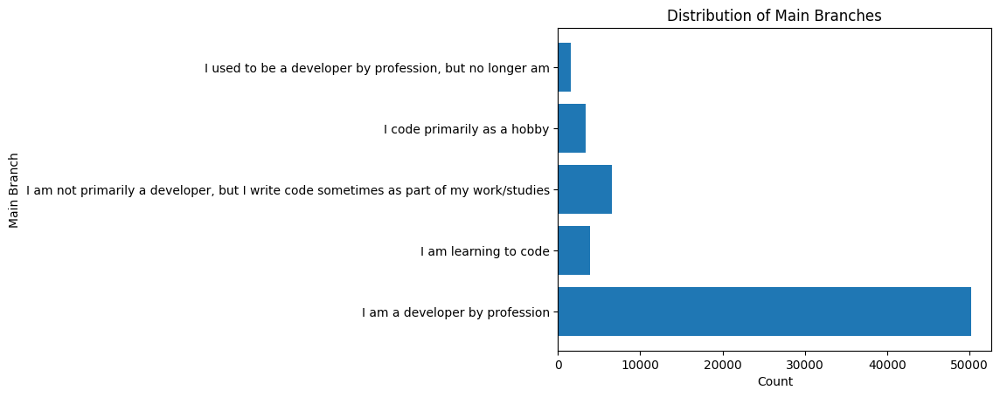

In [25]:
import pandas as pd
import matplotlib.pyplot as plt
import sqlite3

# Connect to the SQLite database
conn = sqlite3.connect('survey-data.sqlite')

# SQL query to get counts for each MainBranch
QUERY = """
SELECT MainBranch, COUNT(*) AS Count
FROM main
GROUP BY MainBranch
"""

# Read data into a DataFrame
main_branch_data = pd.read_sql_query(QUERY, conn)

# Create the horizontal bar chart
plt.barh(main_branch_data['MainBranch'], main_branch_data['Count'])
plt.xlabel('Count')
plt.ylabel('Main Branch')
plt.title('Distribution of Main Branches')
plt.show()

# Close the connection (optional)
conn.close()

Summary¶
In this lab, you focused on extracting and visualizing data from an RDBMS using SQL queries and SQLite. You applied various visualization techniques, including:

Histograms to display the distribution of CompTotal.
Box plots to show the spread of ages.
Scatter plots and bubble plots to explore relationships between variables like Age, WorkExp, TimeSearching and TimeAnswering.
Pie charts and stacked charts to visualize the composition of data.
Line charts and bar charts to compare data across categories.

In [26]:
conn.close()

**Histogram**

In [27]:
!wget -O survey-data.sqlite https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/QR9YeprUYhOoLafzlLspAw/survey-results-public.sqlite

--2025-02-21 20:35:56--  https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/QR9YeprUYhOoLafzlLspAw/survey-results-public.sqlite
Resolving cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)... 169.45.118.108
Connecting to cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)|169.45.118.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 211415040 (202M) [application/octet-stream]
Saving to: ‘survey-data.sqlite’

survey-data.sqlite  100%[===================>] 201.62M  29.5MB/s    in 7.3s    

2025-02-21 20:36:04 (27.7 MB/s) - ‘survey-data.sqlite’ saved [211415040/211415040]



In [28]:
!pip install pandas

In [29]:
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt

In [30]:
conn = sqlite3.connect('survey-data.sqlite')

In [31]:
QUERY = "SELECT COUNT(*) FROM main"
df = pd.read_sql_query(QUERY, conn)
print(df)

   COUNT(*)
0     65437


In [32]:
QUERY = """
SELECT name as Table_Name
FROM sqlite_master
WHERE type = 'table'
"""
pd.read_sql_query(QUERY, conn)

,Table_Name
0,main


In [33]:
QUERY = """
SELECT Age, COUNT(*) as count
FROM main
GROUP BY Age
ORDER BY Age
"""
df_age = pd.read_sql_query(QUERY, conn)
print(df_age)

                  Age  count
0     18-24 years old  14098
1     25-34 years old  23911
2     35-44 years old  14942
3     45-54 years old   6249
4     55-64 years old   2575
5   65 years or older    772
6   Prefer not to say    322
7  Under 18 years old   2568


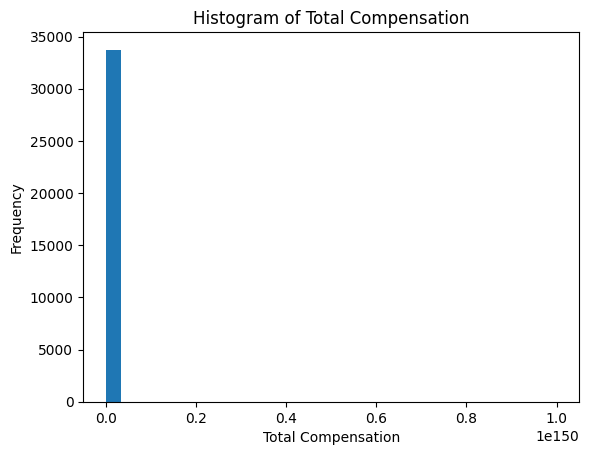

In [34]:
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt

# Connect to the SQLite database
conn = sqlite3.connect('survey-data.sqlite')

# SQL query to select CompTotal
QUERY = """
SELECT CompTotal
FROM main
"""

# Read data into a DataFrame
comp_total_data = pd.read_sql_query(QUERY, conn)

# Create the histogram
plt.hist(comp_total_data['CompTotal'], bins=30)  # Adjust bins as needed
plt.xlabel('Total Compensation')
plt.ylabel('Frequency')
plt.title('Histogram of Total Compensation')
plt.show()

# Close the connection (optional)
conn.close()

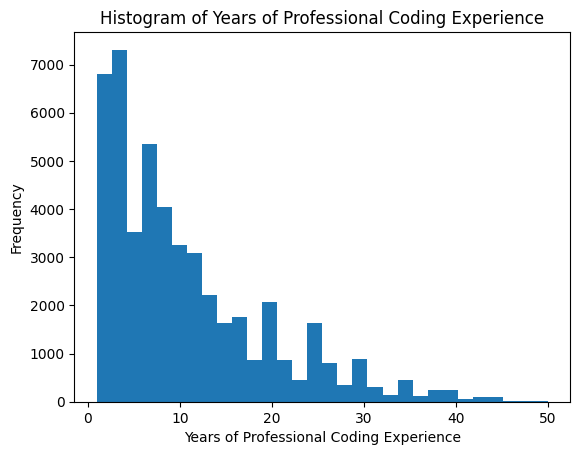

In [37]:
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt

# Connect to the SQLite database
conn = sqlite3.connect('survey-data.sqlite')

# SQL query to select YearsCodePro
QUERY = """
SELECT YearsCodePro
FROM main
"""

# Read data into a DataFrame
years_code_pro_data = pd.read_sql_query(QUERY, conn)

# Convert 'YearsCodePro' to numeric, handling errors
years_code_pro_data['YearsCodePro'] = pd.to_numeric(years_code_pro_data['YearsCodePro'], errors='coerce')

# Drop rows with NaN values (introduced by 'coerce')
years_code_pro_data = years_code_pro_data.dropna()

# Create the histogram
plt.hist(years_code_pro_data['YearsCodePro'], bins=30)  # Adjust bins as needed
plt.xlabel('Years of Professional Coding Experience')
plt.ylabel('Frequency')
plt.title('Histogram of Years of Professional Coding Experience')
plt.show()

# Close the connection (optional)
conn.close()

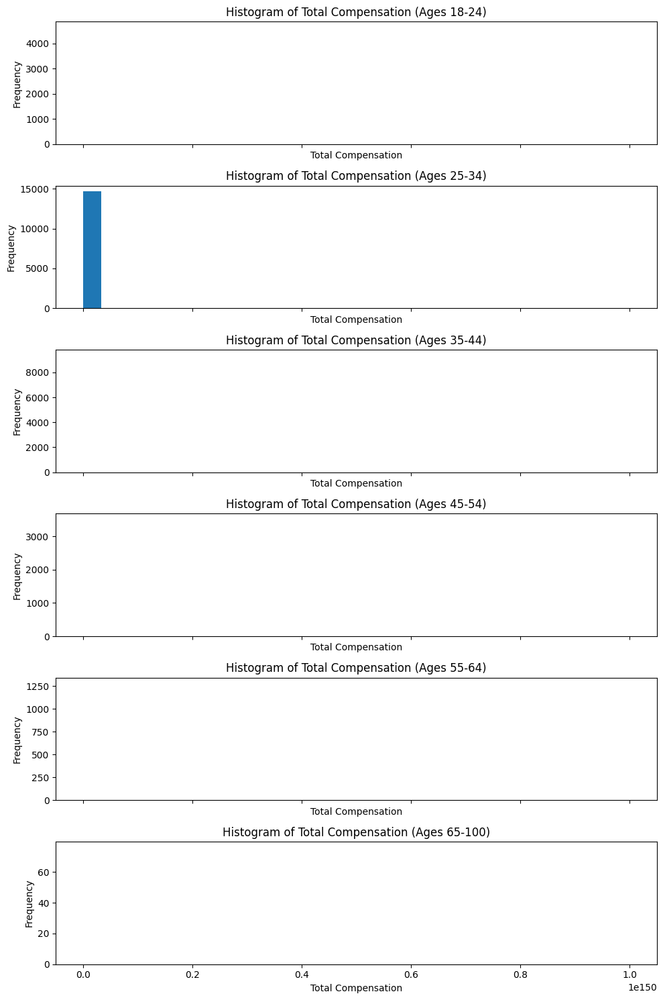

In [38]:
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt

# Connect to the SQLite database
conn = sqlite3.connect('survey-data.sqlite')

# Define age groups
age_groups = [(18, 24), (25, 34), (35, 44), (45, 54), (55, 64), (65, 100)]  # Adjust as needed

# Create subplots for each age group
fig, axes = plt.subplots(len(age_groups), 1, figsize=(10, 15), sharex=True)  # Adjust figsize as needed

# Loop through age groups and create histograms
for i, (age_min, age_max) in enumerate(age_groups):
    # SQL query to select CompTotal for the current age group
    QUERY = f"""
    SELECT CompTotal
    FROM main
    WHERE CAST(Age AS REAL) BETWEEN {age_min} AND {age_max}
    """
    comp_total_data = pd.read_sql_query(QUERY, conn)

    # Convert 'CompTotal' to numeric, handling errors
    comp_total_data['CompTotal'] = pd.to_numeric(comp_total_data['CompTotal'], errors='coerce')

    # Drop rows with NaN values
    comp_total_data = comp_total_data.dropna()

    # Create the histogram for the current age group
    axes[i].hist(comp_total_data['CompTotal'], bins=30)  # Adjust bins as needed
    axes[i].set_xlabel('Total Compensation')
    axes[i].set_ylabel('Frequency')
    axes[i].set_title(f'Histogram of Total Compensation (Ages {age_min}-{age_max})')

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

# Close the connection (optional)
conn.close()

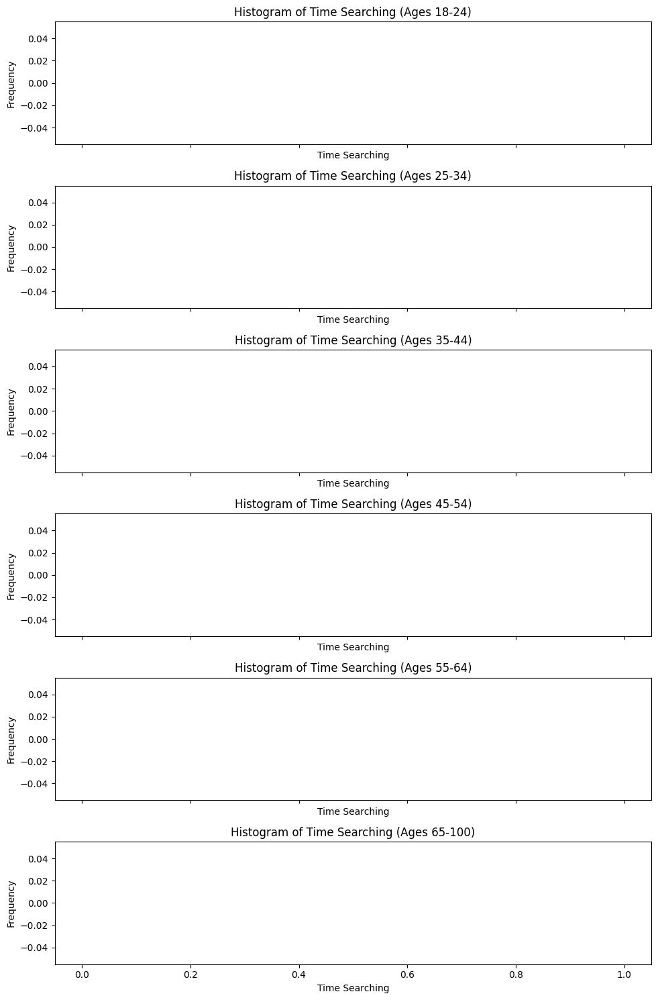

In [39]:
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt

# Connect to the SQLite database
conn = sqlite3.connect('survey-data.sqlite')

# Define age groups
age_groups = [(18, 24), (25, 34), (35, 44), (45, 54), (55, 64), (65, 100)]

# Create subplots for each age group
fig, axes = plt.subplots(len(age_groups), 1, figsize=(10, 15), sharex=True)

# Loop through age groups and create histograms
for i, (age_min, age_max) in enumerate(age_groups):
    # SQL query to select TimeSearching for the current age group
    QUERY = f"""
    SELECT TimeSearching
    FROM main
    WHERE CAST(Age AS REAL) BETWEEN {age_min} AND {age_max}
    """
    time_searching_data = pd.read_sql_query(QUERY, conn)

    # Convert 'TimeSearching' to numeric, handling errors
    time_searching_data['TimeSearching'] = pd.to_numeric(time_searching_data['TimeSearching'], errors='coerce')

    # Drop rows with NaN values
    time_searching_data = time_searching_data.dropna()

    # Create the histogram for the current age group
    axes[i].hist(time_searching_data['TimeSearching'], bins=30)
    axes[i].set_xlabel('Time Searching')
    axes[i].set_ylabel('Frequency')
    axes[i].set_title(f'Histogram of Time Searching (Ages {age_min}-{age_max})')

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

# Close the connection (optional)
conn.close()

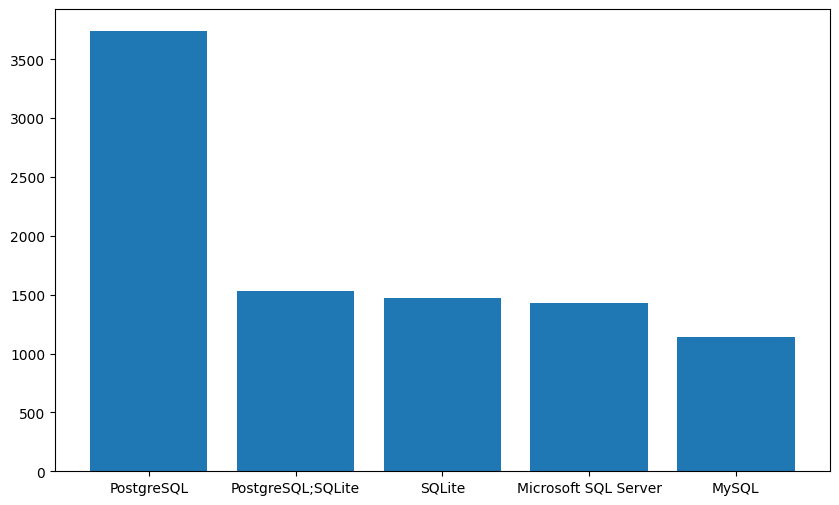

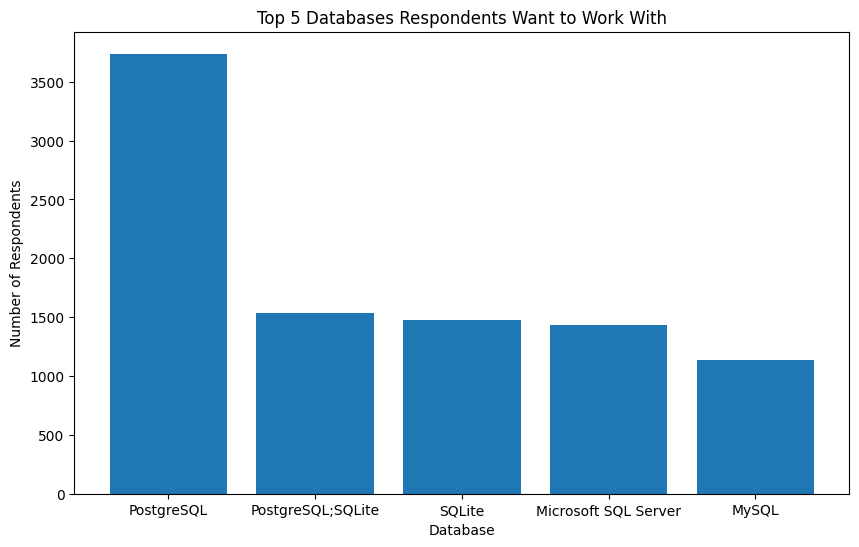

In [42]:
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt

# Connect to the SQLite database
conn = sqlite3.connect('survey-data.sqlite')

# SQL query to get the top 5 databases
QUERY = """
SELECT DatabaseWantToWorkWith, COUNT(*) AS Count
FROM main
WHERE DatabaseWantToWorkWith IS NOT NULL
GROUP BY DatabaseWantToWorkWith
ORDER BY Count DESC
LIMIT 5
"""

# Read data into a DataFrame
df_top5_db = pd.read_sql_query(QUERY, conn)

# Create the histogram
plt.figure(figsize=(10, 6))  # Adjust figure size if needed
plt.bar(df_top5_db['DatabaseWantToWorkWith'], df_top5_db['Count'])
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt

# Connect to the SQLite database
conn = sqlite3.connect('survey-data.sqlite')

# SQL query to get the top 5 databases
QUERY = """
SELECT DatabaseWantToWorkWith, COUNT(*) AS Count
FROM main
WHERE DatabaseWantToWorkWith IS NOT NULL
GROUP BY DatabaseWantToWorkWith
ORDER BY Count DESC
LIMIT 5
"""

# Read data into a DataFrame
df_top5_db = pd.read_sql_query(QUERY, conn)

# Create the histogram
plt.figure(figsize=(10, 6))  # Adjust figure size if needed
plt.bar(df_top5_db['DatabaseWantToWorkWith'], df_top5_db['Count'])
plt.xlabel('Database')
plt.ylabel('Number of Respondents')
plt.title('Top 5 Databases Respondents Want to Work With') #Added title
plt.show()

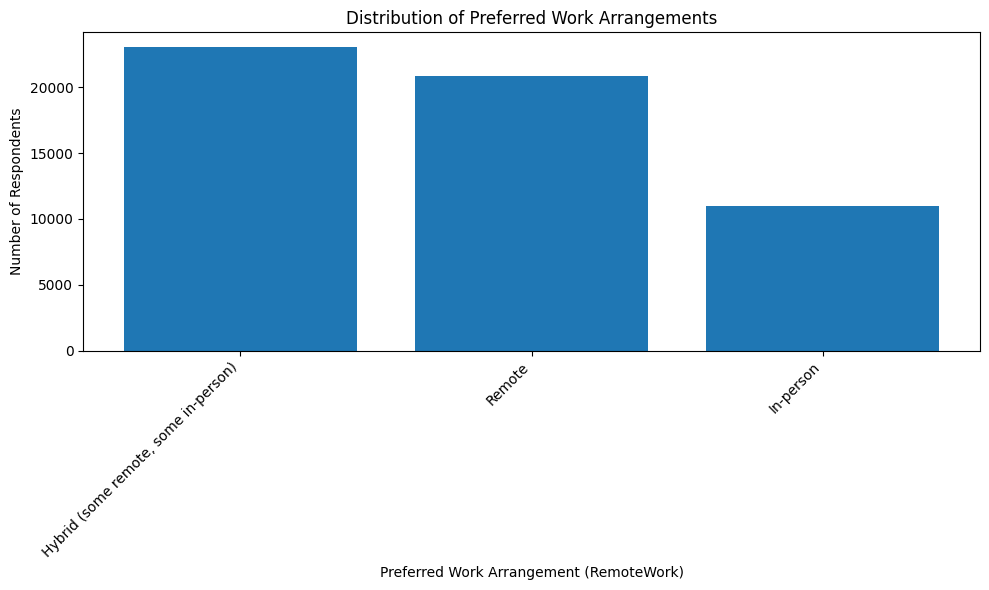

In [43]:
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt

# Connect to the SQLite database
conn = sqlite3.connect('survey-data.sqlite')

# SQL query to get counts for each RemoteWork option
QUERY = """
SELECT RemoteWork, COUNT(*) AS Count
FROM main
WHERE RemoteWork IS NOT NULL
GROUP BY RemoteWork
ORDER BY Count DESC
"""

# Read data into a DataFrame
remote_work_data = pd.read_sql_query(QUERY, conn)

# Create the histogram
plt.figure(figsize=(10, 6))  # Adjust figure size if needed
plt.bar(remote_work_data['RemoteWork'], remote_work_data['Count'])
plt.xlabel('Preferred Work Arrangement (RemoteWork)')
plt.ylabel('Number of Respondents')
plt.title('Distribution of Preferred Work Arrangements')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability if needed
plt.tight_layout()
plt.show()

# Close the connection (optional)
conn.close()

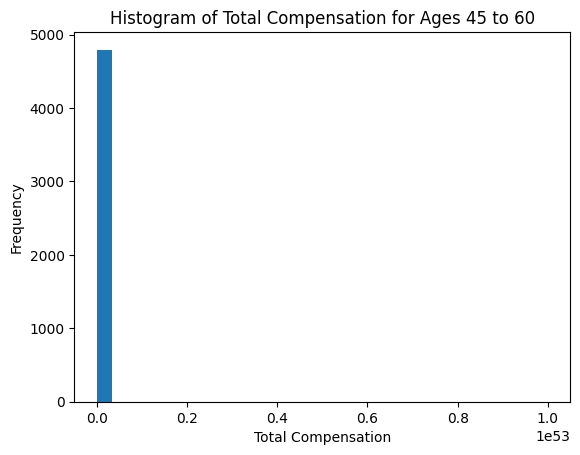

In [44]:
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt

# Connect to the SQLite database
conn = sqlite3.connect('survey-data.sqlite')

# SQL query to select CompTotal for ages 45 to 60
QUERY = """
SELECT CompTotal
FROM main
WHERE CAST(Age AS REAL) BETWEEN 45 AND 60
"""

# Read data into a DataFrame
comp_total_data_45_60 = pd.read_sql_query(QUERY, conn)

# Convert 'CompTotal' to numeric, handling errors
comp_total_data_45_60['CompTotal'] = pd.to_numeric(comp_total_data_45_60['CompTotal'], errors='coerce')

# Drop rows with NaN values
comp_total_data_45_60 = comp_total_data_45_60.dropna()

# Create the histogram
plt.hist(comp_total_data_45_60['CompTotal'], bins=30)  # Adjust bins as needed
plt.xlabel('Total Compensation')
plt.ylabel('Frequency')
plt.title('Histogram of Total Compensation for Ages 45 to 60')
plt.show()

# Close the connection (optional)
conn.close()

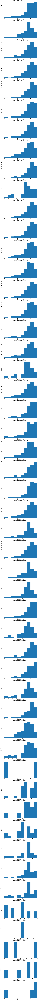

In [45]:
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Connect to the SQLite database
conn = sqlite3.connect('survey-data.sqlite')

# SQL query to get JobSat and YearsCodePro
QUERY = """
SELECT JobSat, YearsCodePro
FROM main
"""
jobsat_data = pd.read_sql_query(QUERY, conn)

# Convert 'YearsCodePro' to numeric, handling errors
jobsat_data['YearsCodePro'] = pd.to_numeric(jobsat_data['YearsCodePro'], errors='coerce')

# Drop rows with NaN values in 'YearsCodePro'
jobsat_data = jobsat_data.dropna(subset=['YearsCodePro'])

# Group data by YearsCodePro and create histograms
unique_years_code_pro = jobsat_data['YearsCodePro'].unique()

# Create subplots for each unique YearsCodePro value
num_plots = len(unique_years_code_pro)
fig, axes = plt.subplots(num_plots, 1, figsize=(10, num_plots * 5))  # Adjust figsize

for i, years_code_pro in enumerate(unique_years_code_pro):
    # Filter data for current YearsCodePro
    filtered_data = jobsat_data[jobsat_data['YearsCodePro'] == years_code_pro]

    # Create histogram for JobSat within the filtered data
    axes[i].hist(filtered_data['JobSat'].dropna(), bins=10)  # Adjust bins as needed
    axes[i].set_xlabel('Job Satisfaction (JobSat)')
    axes[i].set_ylabel('Frequency')
    axes[i].set_title(f'Histogram of JobSat for YearsCodePro = {years_code_pro}')

plt.tight_layout()
plt.show()

# Close the connection (optional)
conn.close()

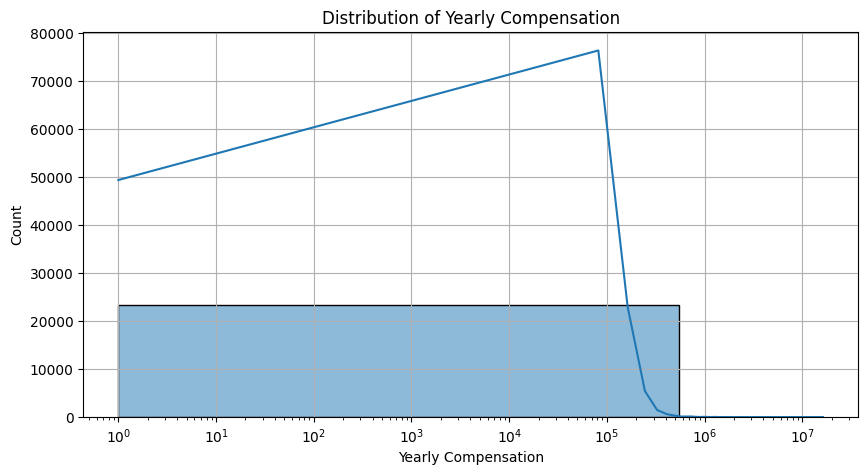

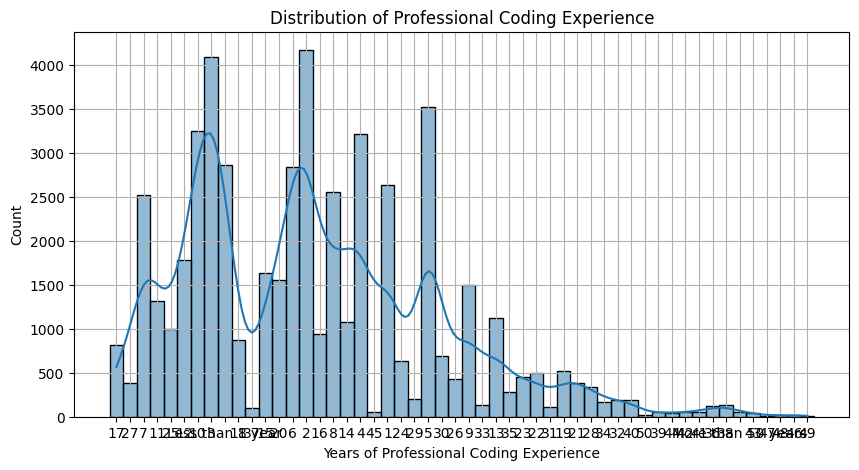

KeyError: 'WorkWeekHrs'

<Figure size 1000x500 with 0 Axes>

In [81]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
file_path = "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/n01PQ9pSmiRX6520flujwQ/survey-data.csv"
df = pd.read_csv(file_path)

# Task: Creating Histograms

# 1. Histogram of Compensation (ConvertedCompYearly)
plt.figure(figsize=(10, 5))
sns.histplot(df["ConvertedCompYearly"], bins=30, kde=True)
plt.title("Distribution of Yearly Compensation")
plt.xlabel("Yearly Compensation")
plt.ylabel("Count")
plt.xscale("log")  # Use log scale for better visualization of skewed data
plt.grid(True)
plt.show()

# 2. Histogram of Coding Experience (YearsCodePro)
plt.figure(figsize=(10, 5))
sns.histplot(df["YearsCodePro"], bins=20, kde=True)
plt.title("Distribution of Professional Coding Experience")
plt.xlabel("Years of Professional Coding Experience")
plt.ylabel("Count")
plt.grid(True)
plt.show()

# 3. Histogram of Work Hours (WorkWeekHrs)
plt.figure(figsize=(10, 5))
sns.histplot(df["WorkWeekHrs"], bins=30, kde=True)
plt.title("Distribution of Work Hours per Week")
plt.xlabel("Work Hours per Week")
plt.ylabel("Count")


Summary
In this lab, you used histograms to visualize various aspects of the dataset, focusing on:

Distribution of compensation, coding experience, and work hours.

Relationships in compensation across age groups and work status.

Composition of data by desired databases and work environments.

Comparisons of job satisfaction across years of experience.

Histograms helped reveal patterns and distributions in the data, enhancing your understanding of developer demographics and preferences.


##**Box Plots**##


In [50]:
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/QR9YeprUYhOoLafzlLspAw/survey-results-public.sqlite

--2025-02-21 20:54:43--  https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/QR9YeprUYhOoLafzlLspAw/survey-results-public.sqlite
Resolving cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)... 169.45.118.108
Connecting to cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)|169.45.118.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 211415040 (202M) [application/octet-stream]
Saving to: ‘survey-results-public.sqlite’

survey-results-publ 100%[===================>] 201.62M  30.9MB/s    in 7.0s    

2025-02-21 20:54:50 (28.9 MB/s) - ‘survey-results-public.sqlite’ saved [211415040/211415040]



In [48]:
!pip install pandas

In [49]:
!pip install matplotlib

In [51]:
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt

# Connect to the SQLite database
conn = sqlite3.connect('survey-results-public.sqlite')

In [52]:
QUERY = "SELECT COUNT(*) FROM main"
df = pd.read_sql_query(QUERY, conn)
print(df)

   COUNT(*)
0     65437


In [53]:
QUERY = """
SELECT name as Table_Name
FROM sqlite_master
WHERE type = 'table'
"""
pd.read_sql_query(QUERY, conn)

,Table_Name
0,main


In [54]:
QUERY = """
SELECT Age, COUNT(*) as count
FROM main
GROUP BY Age
ORDER BY Age
"""
df_age = pd.read_sql_query(QUERY, conn)
print(df_age)

                  Age  count
0     18-24 years old  14098
1     25-34 years old  23911
2     35-44 years old  14942
3     45-54 years old   6249
4     55-64 years old   2575
5   65 years or older    772
6   Prefer not to say    322
7  Under 18 years old   2568


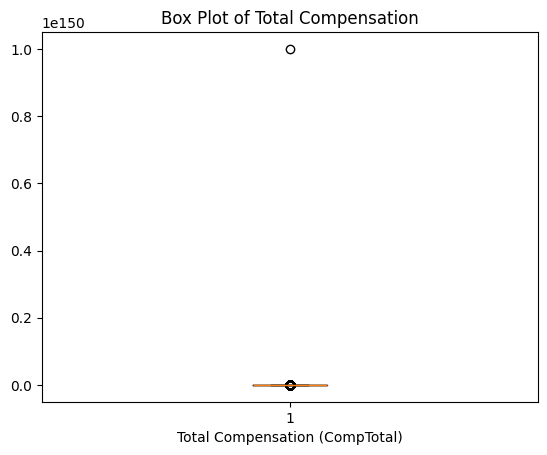

In [55]:
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt

# Connect to the SQLite database
conn = sqlite3.connect('survey-data.sqlite')

# SQL query to select CompTotal
QUERY = """
SELECT CompTotal
FROM main
"""

# Read data into a DataFrame
comp_total_data = pd.read_sql_query(QUERY, conn)

# Convert 'CompTotal' to numeric, handling errors
comp_total_data['CompTotal'] = pd.to_numeric(comp_total_data['CompTotal'], errors='coerce')

# Drop rows with NaN values
comp_total_data = comp_total_data.dropna()

# Create the box plot
plt.boxplot(comp_total_data['CompTotal'])
plt.xlabel('Total Compensation (CompTotal)')
plt.title('Box Plot of Total Compensation')
plt.show()



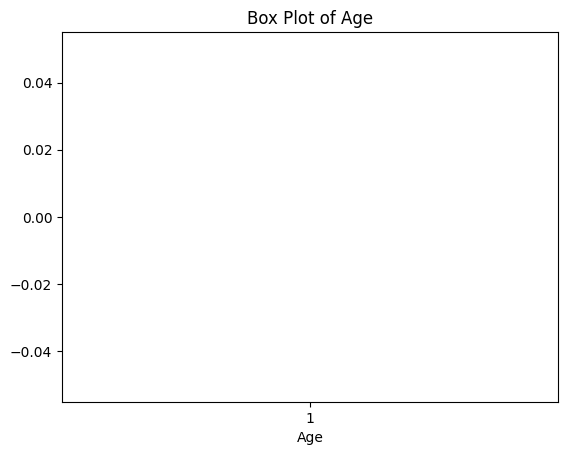

In [47]:
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt

# Connect to the SQLite database
conn = sqlite3.connect('survey-data.sqlite')

# SQL query to select Age
QUERY = """
SELECT Age
FROM main
"""

# Read data into a DataFrame
age_data = pd.read_sql_query(QUERY, conn)

# Convert 'Age' column to numeric, handling non-numeric values
age_data['Age'] = pd.to_numeric(age_data['Age'], errors='coerce')

# Drop rows with NaN values (introduced by 'coerce')
age_data = age_data.dropna()

# Create the box plot
plt.boxplot(age_data['Age'])
plt.xlabel('Age')
plt.title('Box Plot of Age')
plt.show()


<ipython-input-57-ea617015ff6a>:34: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(comp_total_by_age, labels=age_labels)


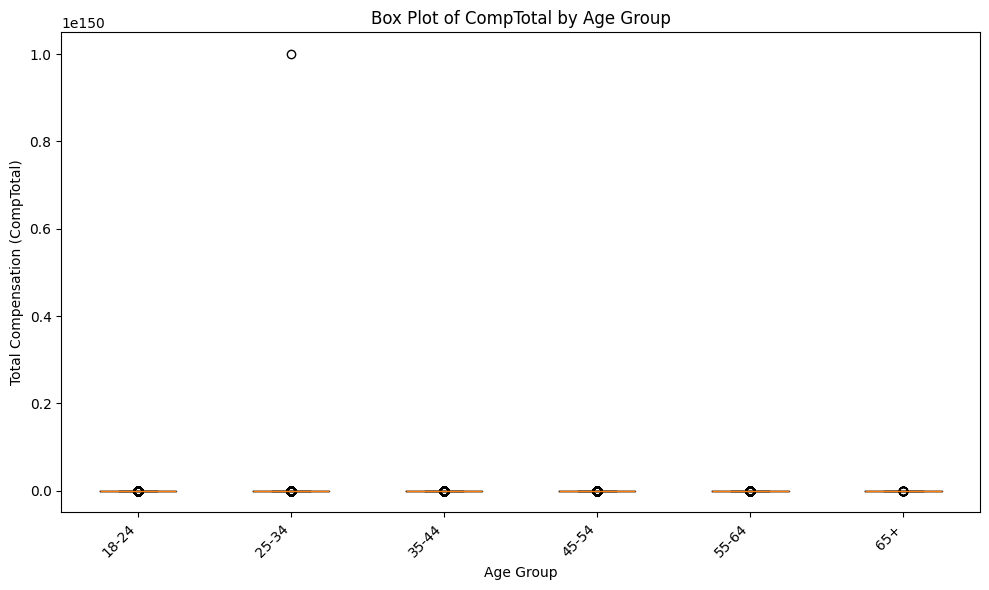

In [57]:
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt

# Connect to the SQLite database
conn = sqlite3.connect('survey-data.sqlite')

# Define age groups and labels
age_groups = [(18, 24), (25, 34), (35, 44), (45, 54), (55, 64), (65, 100)]
age_labels = ['18-24', '25-34', '35-44', '45-54', '55-64', '65+']

# Create a list to store CompTotal data for each age group
comp_total_by_age = []

# Loop through age groups and extract CompTotal data
for age_min, age_max in age_groups:
    QUERY = f"""
    SELECT CompTotal
    FROM main
    WHERE CAST(Age AS REAL) BETWEEN {age_min} AND {age_max}
    """
    comp_total_data = pd.read_sql_query(QUERY, conn)

    # Convert 'CompTotal' to numeric and handle errors
    comp_total_data['CompTotal'] = pd.to_numeric(comp_total_data['CompTotal'], errors='coerce')

    # Drop rows with NaN values
    comp_total_data = comp_total_data.dropna()

    comp_total_by_age.append(comp_total_data['CompTotal'])

# Create the box plot
plt.figure(figsize=(10, 6))  # Adjust figure size if needed
plt.boxplot(comp_total_by_age, labels=age_labels)
plt.xlabel('Age Group')
plt.ylabel('Total Compensation (CompTotal)')
plt.title('Box Plot of CompTotal by Age Group')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels if needed
plt.tight_layout()
plt.show()


<ipython-input-61-d6bb0f9b4fca>:35: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group['CompTotal'] for name, group in comp_jobsat_data.groupby('JobSatCategory')
<ipython-input-61-d6bb0f9b4fca>:72: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group['CompTotal'] for name, group in comp_jobsat_data.groupby('JobSatCategory')
<ipython-input-61-d6bb0f9b4fca>:78: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(comp_total_by_jobsat, labels=labels)


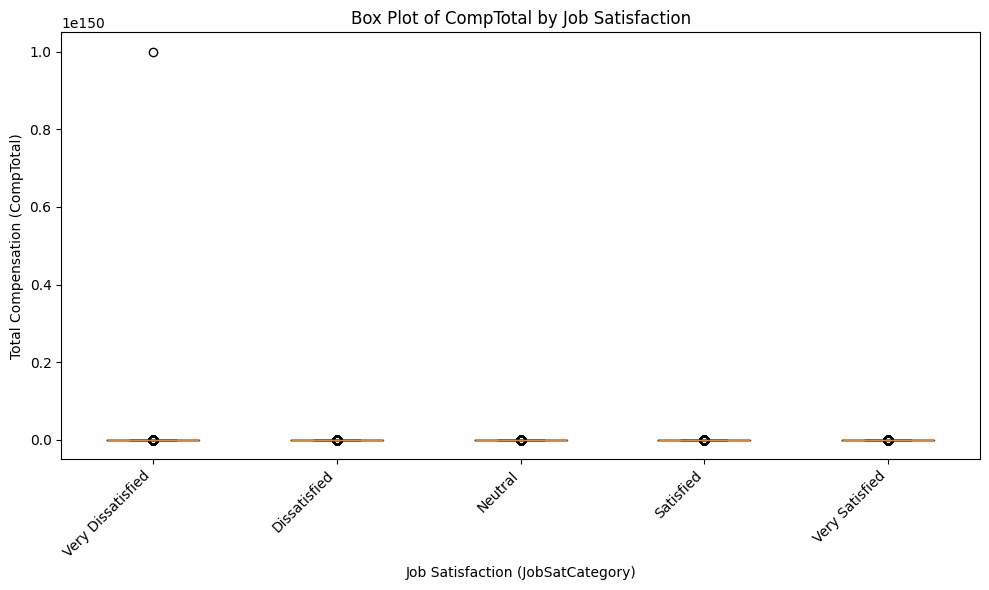

<ipython-input-61-d6bb0f9b4fca>:119: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group['CompTotal'] for name, group in comp_jobsat_data.groupby('JobSatCategory')
<ipython-input-61-d6bb0f9b4fca>:125: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(comp_total_by_jobsat, labels=labels)


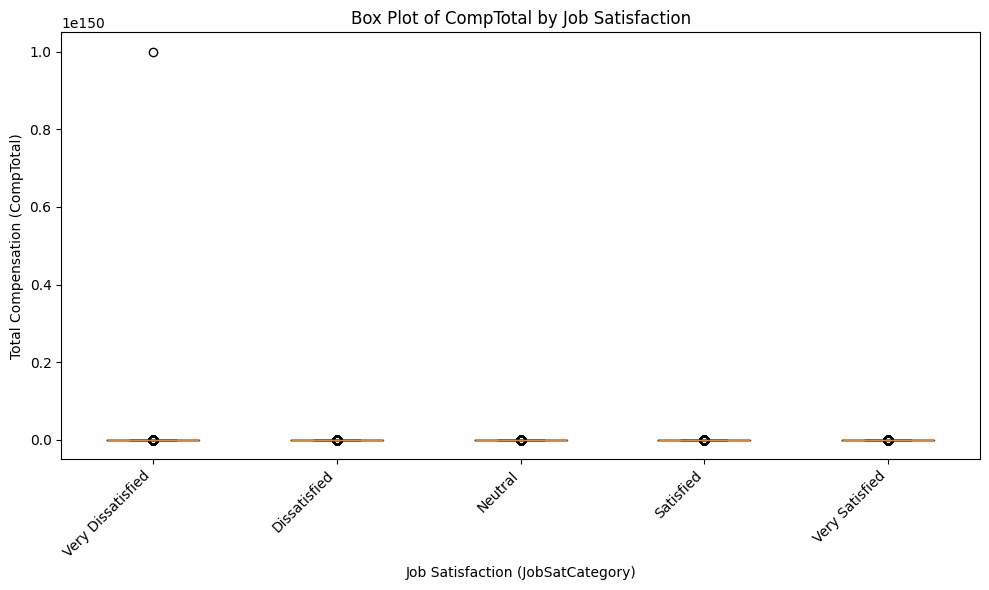

In [61]:
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Connect to the SQLite database
conn = sqlite3.connect('survey-data.sqlite')

# SQL query to get CompTotal and JobSat
QUERY = """
SELECT CompTotal, JobSat
FROM main
"""

# Read data into a DataFrame
comp_jobsat_data = pd.read_sql_query(QUERY, conn)

# Convert 'CompTotal' to numeric, handling errors
comp_jobsat_data['CompTotal'] = pd.to_numeric(comp_jobsat_data['CompTotal'], errors='coerce')

# Drop rows with NaN values in 'CompTotal'
comp_jobsat_data = comp_jobsat_data.dropna(subset=['CompTotal'])

# Create JobSat bins and labels (adjust bins as needed)
bins = [0, 2, 4, 6, 8, 10]  # Example bins: 0-2, 2-4, 4-6, 6-8, 8-10
labels = ['Very Dissatisfied', 'Dissatisfied', 'Neutral', 'Satisfied', 'Very Satisfied']

# Create a new column with JobSat categories
comp_jobsat_data['JobSatCategory'] = pd.cut(
    comp_jobsat_data['JobSat'].astype(float), bins=bins, labels=labels, include_lowest=True, duplicates='drop'
)

# Group data by JobSatCategory and extract CompTotal data
comp_total_by_jobsat = [
    group['CompTotal'] for name, group in comp_jobsat_data.groupby('JobSatCategory')
]

import sqlite3
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Connect to the SQLite database
conn = sqlite3.connect('survey-data.sqlite')

# SQL query to get CompTotal and JobSat
QUERY = """
SELECT CompTotal, JobSat
FROM main
"""

# Read data into a DataFrame
comp_jobsat_data = pd.read_sql_query(QUERY, conn)

# Convert 'CompTotal' to numeric, handling errors
comp_jobsat_data['CompTotal'] = pd.to_numeric(comp_jobsat_data['CompTotal'], errors='coerce')

# Drop rows with NaN values in 'CompTotal'
comp_jobsat_data = comp_jobsat_data.dropna(subset=['CompTotal'])

# Create JobSat bins and labels (adjust bins as needed)
bins = [0, 2, 4, 6, 8, 10]  # Example bins: 0-2, 2-4, 4-6, 6-8, 8-10
labels = ['Very Dissatisfied', 'Dissatisfied', 'Neutral', 'Satisfied', 'Very Satisfied']

# Create a new column with JobSat categories
comp_jobsat_data['JobSatCategory'] = pd.cut(
    comp_jobsat_data['JobSat'].astype(float), bins=bins, labels=labels, include_lowest=True, duplicates='drop'
)

# Group data by JobSatCategory and extract CompTotal data
comp_total_by_jobsat = [
    group['CompTotal'] for name, group in comp_jobsat_data.groupby('JobSatCategory')
]


# Create the box plot
plt.figure(figsize=(10, 6))  # Adjust figure size if needed
plt.boxplot(comp_total_by_jobsat, labels=labels)
plt.xlabel('Job Satisfaction (JobSatCategory)')
plt.ylabel('Total Compensation (CompTotal)')
plt.title('Box Plot of CompTotal by Job Satisfaction')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels if needed
plt.tight_layout()
plt.show()
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Connect to the SQLite database
conn = sqlite3.connect('survey-data.sqlite')

# SQL query to get CompTotal and JobSat
QUERY = """
SELECT CompTotal, JobSat
FROM main
"""

# Read data into a DataFrame
comp_jobsat_data = pd.read_sql_query(QUERY, conn)

# Convert 'CompTotal' to numeric, handling errors
comp_jobsat_data['CompTotal'] = pd.to_numeric(comp_jobsat_data['CompTotal'], errors='coerce')

# Drop rows with NaN values in 'CompTotal'
comp_jobsat_data = comp_jobsat_data.dropna(subset=['CompTotal'])

# Create JobSat bins and labels (adjust bins as needed)
bins = [0, 2, 4, 6, 8, 10]  # Example bins: 0-2, 2-4, 4-6, 6-8, 8-10
labels = ['Very Dissatisfied', 'Dissatisfied', 'Neutral', 'Satisfied', 'Very Satisfied']

# Create a new column with JobSat categories
comp_jobsat_data['JobSatCategory'] = pd.cut(
    comp_jobsat_data['JobSat'].astype(float), bins=bins, labels=labels, include_lowest=True, duplicates='drop'
)

# Group data by JobSatCategory and extract CompTotal data
comp_total_by_jobsat = [
    group['CompTotal'] for name, group in comp_jobsat_data.groupby('JobSatCategory')
]


# Create the box plot
plt.figure(figsize=(10, 6))  # Adjust figure size if needed
plt.boxplot(comp_total_by_jobsat, labels=labels)
plt.xlabel('Job Satisfaction (JobSatCategory)')
plt.ylabel('Total Compensation (CompTotal)')
plt.title('Box Plot of CompTotal by Job Satisfaction')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels if needed
plt.tight_layout()
plt.show()


<ipython-input-64-50ccc7b49574>:35: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(comp_by_devtype, labels=top5_devtypes)


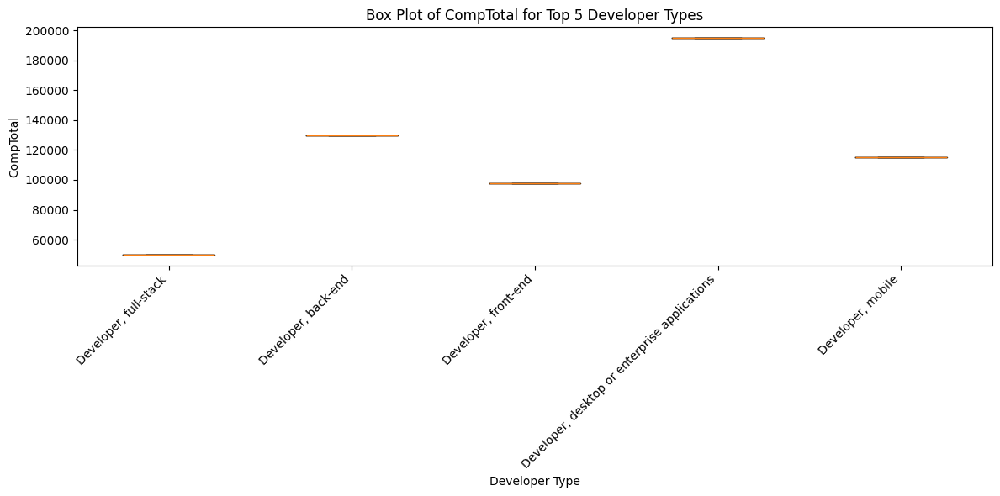

In [64]:
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt

# Connect to the SQLite database
conn = sqlite3.connect('survey-data.sqlite')

# SQL query to get the top 5 developer types and their CompTotal with sufficient data
QUERY = """
SELECT DevType, CompTotal
FROM main
WHERE DevType IS NOT NULL AND CompTotal IS NOT NULL  -- Filter for non-null CompTotal
GROUP BY DevType
ORDER BY COUNT(*) DESC
LIMIT 5
"""

# Read data into a DataFrame
devtype_comp_data = pd.read_sql_query(QUERY, conn)

# Convert 'CompTotal' to numeric, handling errors
devtype_comp_data['CompTotal'] = pd.to_numeric(devtype_comp_data['CompTotal'], errors='coerce')

# Drop rows with NaN values in 'CompTotal'
devtype_comp_data = devtype_comp_data.dropna(subset=['CompTotal'])

# Group data by DevType and extract CompTotal data
comp_by_devtype = [group['CompTotal'] for name, group in devtype_comp_data.groupby('DevType')]

# Get the top 5 DevType labels
top5_devtypes = devtype_comp_data['DevType'].unique()[:5]

# Create the box plot
plt.figure(figsize=(12, 6))  # Adjust figure size if needed
plt.boxplot(comp_by_devtype, labels=top5_devtypes)
plt.xlabel('Developer Type')
plt.ylabel('CompTotal')
plt.title('Box Plot of CompTotal for Top 5 Developer Types')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels if needed
plt.tight_layout()
plt.show()

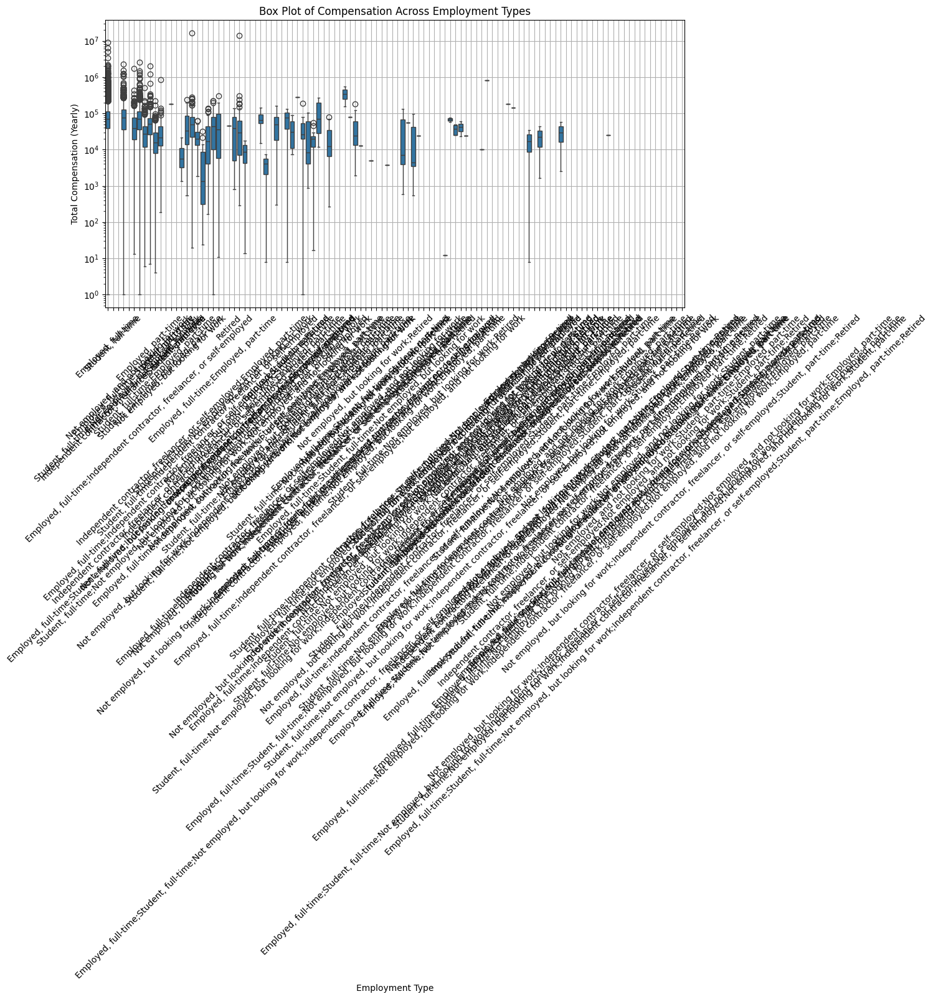

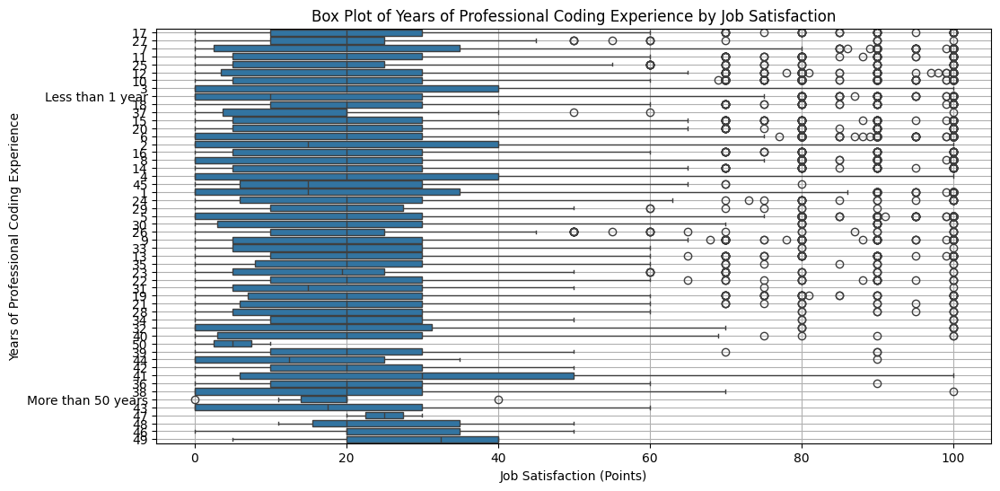

In [77]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
file_path = "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/n01PQ9pSmiRX6520flujwQ/survey-data.csv"
df = pd.read_csv(file_path)

# Task 4: Visualizing Comparison of Data

# 1. Box Plot of Compensation (CompTotal) Across Employment Types
plt.figure(figsize=(12, 6))
sns.boxplot(data=df, x="Employment", y="ConvertedCompYearly")
plt.title("Box Plot of Compensation Across Employment Types")
plt.xlabel("Employment Type")
plt.ylabel("Total Compensation (Yearly)")
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.yscale("log")  # Log scale to handle extreme values
plt.grid(True)
plt.show()

# 2. Box Plot of Years of Professional Coding Experience by Job Satisfaction
plt.figure(figsize=(12, 6))
sns.boxplot(data=df, x="JobSatPoints_6", y="YearsCodePro")
plt.title("Box Plot of Years of Professional Coding Experience by Job Satisfaction")
plt.xlabel("Job Satisfaction (Points)")
plt.ylabel("Years of Professional Coding Experience")
plt.grid(True)
plt.show()

# Final Step: Close the Database Connection (if applicable)
# If a database connection was opened (e.g., using SQLite, MySQL, etc.),
# you would close it here. Since we're using a CSV file, there's no database connection to close.


<ipython-input-69-203cc66b1f62>:68: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(yearscodepro_by_jobsat, labels=jobsat_labels)


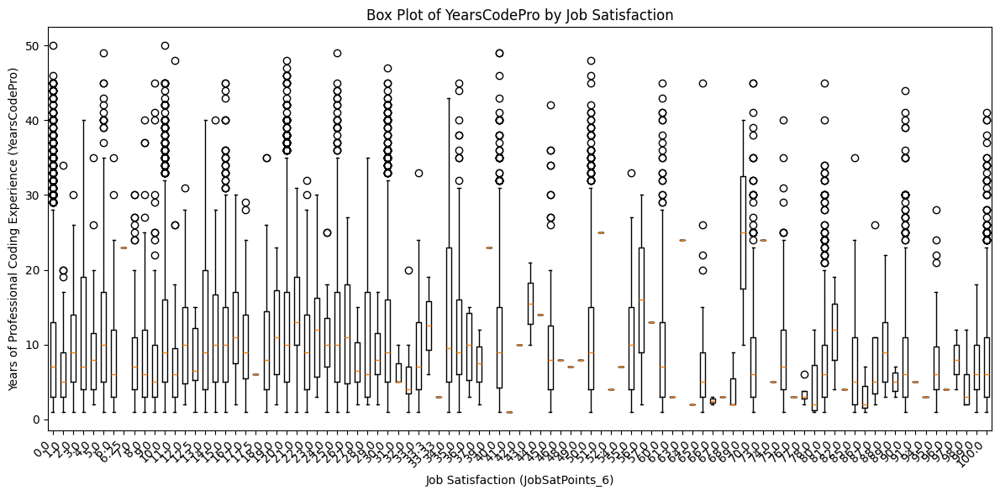

<ipython-input-69-203cc66b1f62>:110: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(yearscodepro_by_jobsat, labels=jobsat_labels)


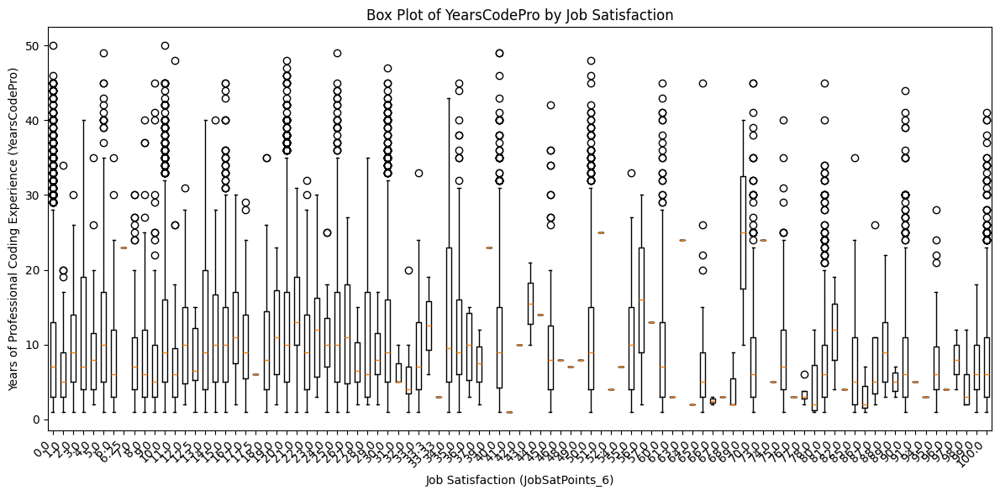

In [69]:
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt

# Connect to the SQLite database
conn = sqlite3.connect('survey-data.sqlite')

# SQL query to get YearsCodePro and JobSatPoints_6
QUERY = """
SELECT YearsCodePro, JobSatPoints_6
FROM main
WHERE YearsCodePro IS NOT NULL AND JobSatPoints_6 IS NOT NULL
"""

# Read data into a DataFrame
jobsat_yearcode_data = pd.read_sql_query(QUERY, conn)

# Convert 'YearsCodePro' to numeric, handling errors
jobsat_yearcode_data['YearsCodePro'] = pd.to_numeric(jobsat_yearcode_data['YearsCodePro'], errors='coerce')

# Convert 'JobSatPoints_6' to numeric, handling errors
jobsat_yearcode_data['JobSatPoints_6'] = pd.to_numeric(jobsat_yearcode_data['JobSatPoints_6'], errors='coerce')


# Drop rows with NaN values in 'YearsCodePro' or 'JobSatPoints_6'
jobsat_yearcode_data = jobsat_yearcode_data.dropna(subset=['YearsCodePro', 'JobSatPoints_6'])

# Group data by JobSatPoints_6 and extract YearsCodePro data
yearscodepro_by_jobsat = [group['YearsCodePro'] for name, group in jobsat_yearcode_data.groupby('JobSatPoints_6')]

# Get unique JobSatPoints_6 values as labels
jobsat_labels = sorted(jobsat_yearcode_data['JobSatPoints_6'].unique())
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt

# Connect to the SQLite database
conn = sqlite3.connect('survey-data.sqlite')

# SQL query to get YearsCodePro and JobSatPoints_6
QUERY = """
SELECT YearsCodePro, JobSatPoints_6
FROM main
WHERE YearsCodePro IS NOT NULL AND JobSatPoints_6 IS NOT NULL
"""

# Read data into a DataFrame
jobsat_yearcode_data = pd.read_sql_query(QUERY, conn)

# Convert 'YearsCodePro' to numeric, handling errors
jobsat_yearcode_data['YearsCodePro'] = pd.to_numeric(jobsat_yearcode_data['YearsCodePro'], errors='coerce')

# Convert 'JobSatPoints_6' to numeric, handling errors
jobsat_yearcode_data['JobSatPoints_6'] = pd.to_numeric(jobsat_yearcode_data['JobSatPoints_6'], errors='coerce')


# Drop rows with NaN values in 'YearsCodePro' or 'JobSatPoints_6'
jobsat_yearcode_data = jobsat_yearcode_data.dropna(subset=['YearsCodePro', 'JobSatPoints_6'])

# Group data by JobSatPoints_6 and extract YearsCodePro data
yearscodepro_by_jobsat = [group['YearsCodePro'] for name, group in jobsat_yearcode_data.groupby('JobSatPoints_6')]

# Get unique JobSatPoints_6 values as labels
jobsat_labels = sorted(jobsat_yearcode_data['JobSatPoints_6'].unique())

# Create the box plot
plt.figure(figsize=(12, 6))  # Adjust figure size if needed
plt.boxplot(yearscodepro_by_jobsat, labels=jobsat_labels)
plt.xlabel('Job Satisfaction (JobSatPoints_6)')
plt.ylabel('Years of Professional Coding Experience (YearsCodePro)')
plt.title('Box Plot of YearsCodePro by Job Satisfaction')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels if needed
plt.tight_layout()
plt.show()
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt

# Connect to the SQLite database
conn = sqlite3.connect('survey-data.sqlite')

# SQL query to get YearsCodePro and JobSatPoints_6
QUERY = """
SELECT YearsCodePro, JobSatPoints_6
FROM main
WHERE YearsCodePro IS NOT NULL AND JobSatPoints_6 IS NOT NULL
"""

# Read data into a DataFrame
jobsat_yearcode_data = pd.read_sql_query(QUERY, conn)

# Convert 'YearsCodePro' to numeric, handling errors
jobsat_yearcode_data['YearsCodePro'] = pd.to_numeric(jobsat_yearcode_data['YearsCodePro'], errors='coerce')

# Convert 'JobSatPoints_6' to numeric, handling errors
jobsat_yearcode_data['JobSatPoints_6'] = pd.to_numeric(jobsat_yearcode_data['JobSatPoints_6'], errors='coerce')


# Drop rows with NaN values in 'YearsCodePro' or 'JobSatPoints_6'
jobsat_yearcode_data = jobsat_yearcode_data.dropna(subset=['YearsCodePro', 'JobSatPoints_6'])

# Group data by JobSatPoints_6 and extract YearsCodePro data
yearscodepro_by_jobsat = [group['YearsCodePro'] for name, group in jobsat_yearcode_data.groupby('JobSatPoints_6')]

# Get unique JobSatPoints_6 values as labels
jobsat_labels = sorted(jobsat_yearcode_data['JobSatPoints_6'].unique())

# Create the box plot
plt.figure(figsize=(12, 6))  # Adjust figure size if needed
plt.boxplot(yearscodepro_by_jobsat, labels=jobsat_labels)
plt.xlabel('Job Satisfaction (JobSatPoints_6)')
plt.ylabel('Years of Professional Coding Experience (YearsCodePro)')
plt.title('Box Plot of YearsCodePro by Job Satisfaction')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels if needed
plt.tight_layout()
plt.show()

In [70]:
conn.close()

Summary
In this lab, you used box plots to visualize various aspects of the dataset, focusing on:

Visualize distributions of compensation and age.

Explore relationships between compensation, job satisfaction, and professional coding experience.

Analyze data composition across developer roles and countries.

Compare compensation across employment types and satisfaction levels.

Box plots provided clear insights into the spread, outliers, and central tendencies of various features in the dataset.

##**SCATTER PLOT**##


In [72]:
!pip install pandas
!pip install matplotlib

import pandas as pd
import matplotlib.pyplot as plt

In [73]:
file_path = "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/n01PQ9pSmiRX6520flujwQ/survey-data.csv"

df = pd.read_csv(file_path)

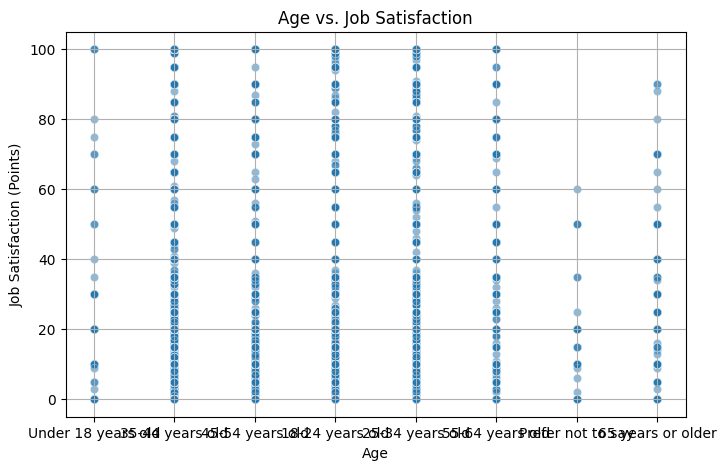

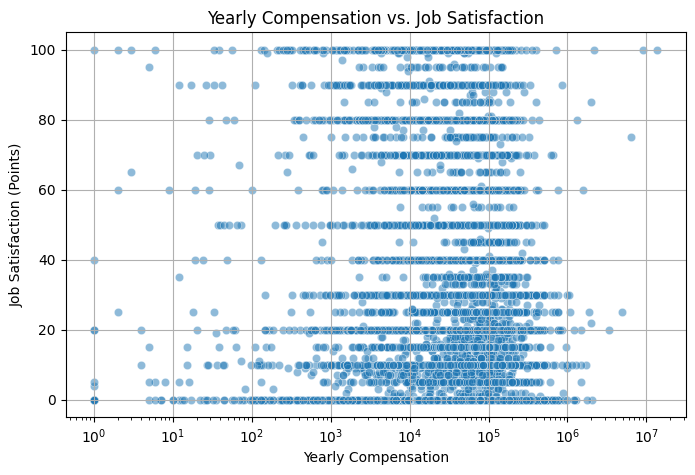

In [75]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
file_path = "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/n01PQ9pSmiRX6520flujwQ/survey-data.csv"
df = pd.read_csv(file_path)

# Scatter Plot: Age vs. Job Satisfaction
plt.figure(figsize=(8, 5))
sns.scatterplot(data=df, x="Age", y="JobSatPoints_6", alpha=0.5)
plt.title("Age vs. Job Satisfaction")
plt.xlabel("Age")
plt.ylabel("Job Satisfaction (Points)")
plt.grid(True)
plt.show()

# Scatter Plot: Compensation vs. Job Satisfaction
plt.figure(figsize=(8, 5))
sns.scatterplot(data=df, x="ConvertedCompYearly", y="JobSatPoints_6", alpha=0.5)
plt.title("Yearly Compensation vs. Job Satisfaction")
plt.xlabel("Yearly Compensation")
plt.ylabel("Job Satisfaction (Points)")
plt.xscale("log")  # Log scale for better visualization if compensation values vary greatly
plt.grid(True)
plt.show()


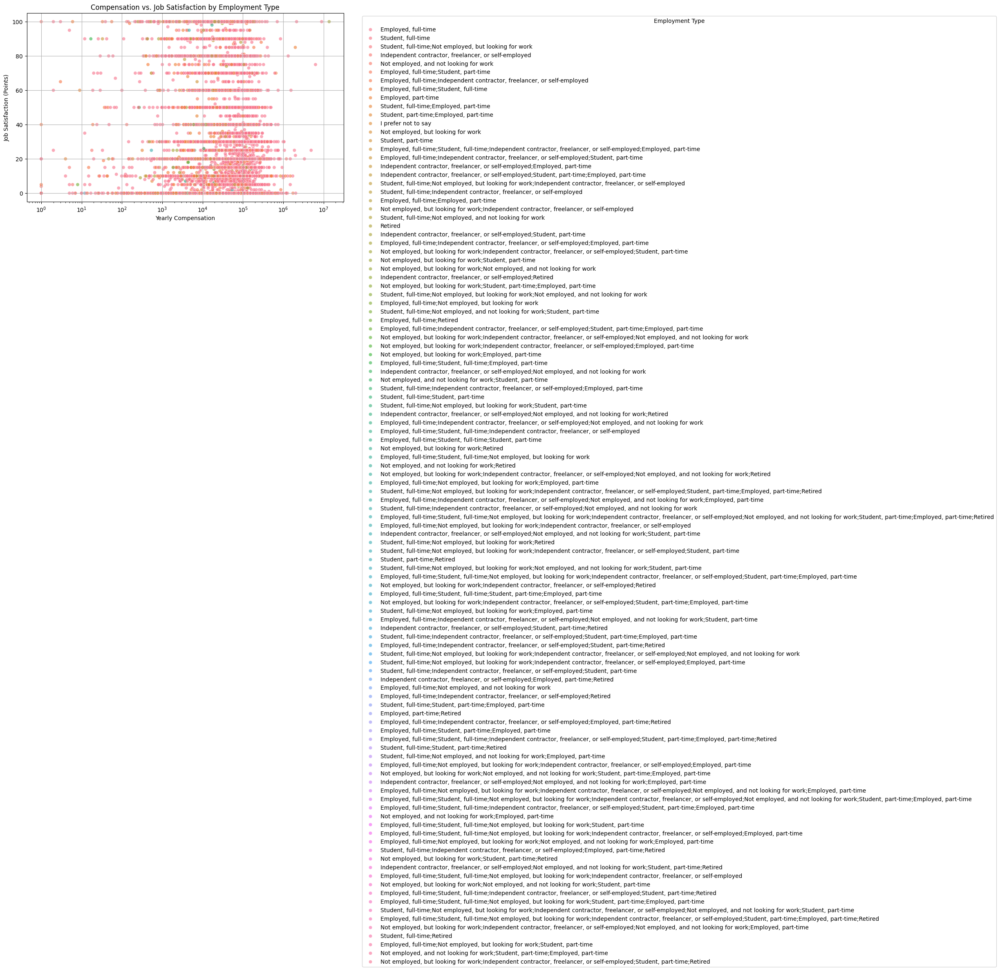

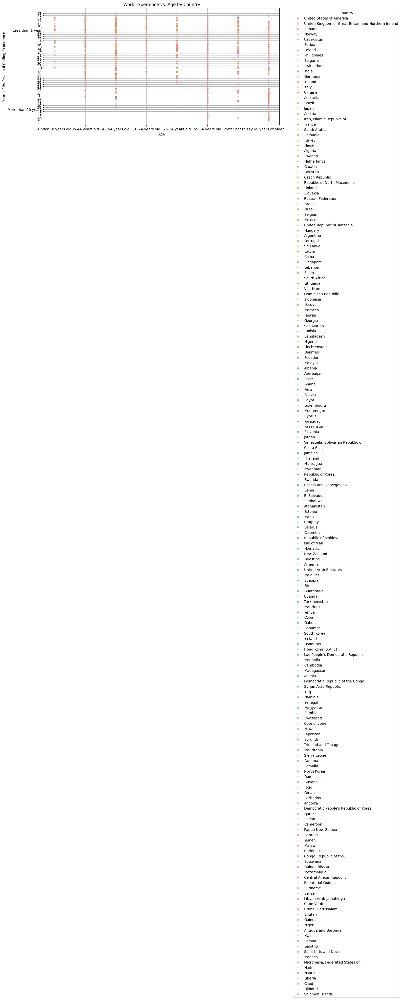

In [76]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
file_path = "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/n01PQ9pSmiRX6520flujwQ/survey-data.csv"
df = pd.read_csv(file_path)

# Task 2: Enhancing Scatter Plots

# Scatter Plot: Compensation vs. Job Satisfaction by Employment Type
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x="ConvertedCompYearly", y="JobSatPoints_6", hue="Employment", alpha=0.6)
plt.title("Compensation vs. Job Satisfaction by Employment Type")
plt.xlabel("Yearly Compensation")
plt.ylabel("Job Satisfaction (Points)")
plt.xscale("log")  # Log scale for better visualization
plt.legend(title="Employment Type", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.grid(True)
plt.show()

# Task 4: Scatter Plot Comparisons Across Groups

# Scatter Plot: Work Experience vs. Age Group by Country
plt.figure(figsize=(12, 6))
sns.scatterplot(data=df, x="Age", y="YearsCodePro", hue="Country", style="Country", alpha=0.7)
plt.title("Work Experience vs. Age by Country")
plt.xlabel("Age")
plt.ylabel("Years of Professional Coding Experience")
plt.legend(title="Country", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.grid(True)
plt.show()


After completing this lab, you will be able to:

Analyze how numerical variables relate across specific groups, such as employment types and countries.
Use scatter plots effectively to represent multiple variables with color, size, and markers.
Gain insights into compensation, satisfaction, and demographic trends using advanced scatter plot techniques.

##**BUBBLE PLOT **##

In [84]:
!pip install pandas
!pip install matplotlib

import pandas as pd
import matplotlib.pyplot as plt

In [85]:
# Step 1: Download the dataset
!wget -O survey-data.csv https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/n01PQ9pSmiRX6520flujwQ/survey-data.csv

# Load the data
df = pd.read_csv("survey-data.csv")

# Display the first few rows of the data to understand its structure
df.head()

--2025-02-21 22:09:44--  https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/n01PQ9pSmiRX6520flujwQ/survey-data.csv
Resolving cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)... 169.63.118.104
Connecting to cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)|169.63.118.104|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 159525875 (152M) [text/csv]
Saving to: ‘survey-data.csv’

survey-data.csv     100%[===================>] 152.13M  79.2MB/s    in 1.9s    

2025-02-21 22:09:46 (79.2 MB/s) - ‘survey-data.csv’ saved [159525875/159525875]



,ResponseId,MainBranch,Age,Employment,RemoteWork,Check,CodingActivities,EdLevel,LearnCode,LearnCodeOnline,...,JobSatPoints_6,JobSatPoints_7,JobSatPoints_8,JobSatPoints_9,JobSatPoints_10,JobSatPoints_11,SurveyLength,SurveyEase,ConvertedCompYearly,JobSat
0,1,I am a developer by profession,Under 18 years old,"Employed, full-time",Remote,Apples,Hobby,Primary/elementary school,Books / Physical media,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,I am a developer by profession,35-44 years old,"Employed, full-time",Remote,Apples,Hobby;Contribute to open-source projects;Other...,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",Books / Physical media;Colleague;On the job tr...,Technical documentation;Blogs;Books;Written Tu...,...,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN
2,3,I am a developer by profession,45-54 years old,"Employed, full-time",Remote,Apples,Hobby;Contribute to open-source projects;Other...,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)",Books / Physical media;Colleague;On the job tr...,Technical documentation;Blogs;Books;Written Tu...,...,NaN,NaN,NaN,NaN,NaN,NaN,Appropriate in length,Easy,NaN,NaN
3,4,I am learning to code,18-24 years old,"Student, full-time",NaN,Apples,NaN,Some college/university study without earning ...,"Other online resources (e.g., videos, blogs, f...",Stack Overflow;How-to videos;Interactive tutorial,...,NaN,NaN,NaN,NaN,NaN,NaN,Too long,Easy,NaN,NaN
4,5,I am a developer by profession,18-24 years old,"Student, full-time",NaN,Apples,NaN,"Secondary school (e.g. American high school, G...","Other online resources (e.g., videos, blogs, f...",Technical documentation;Blogs;Written Tutorial...,...,NaN,NaN,NaN,NaN,NaN,NaN,Too short,Easy,NaN,NaN


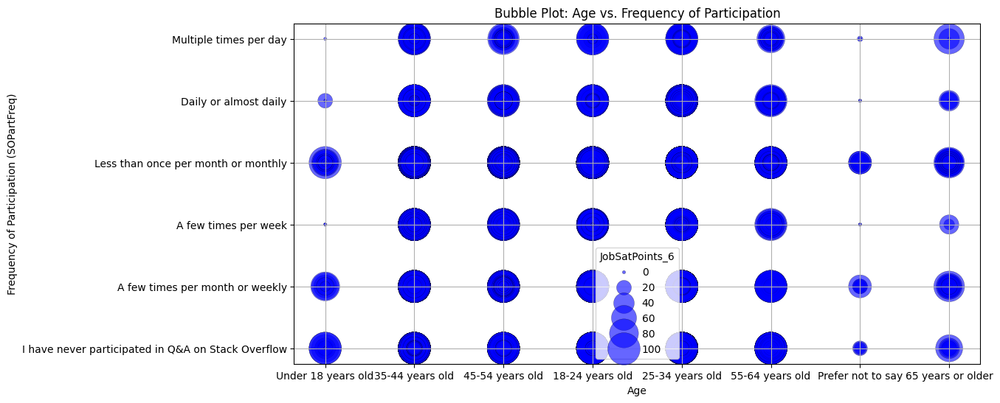

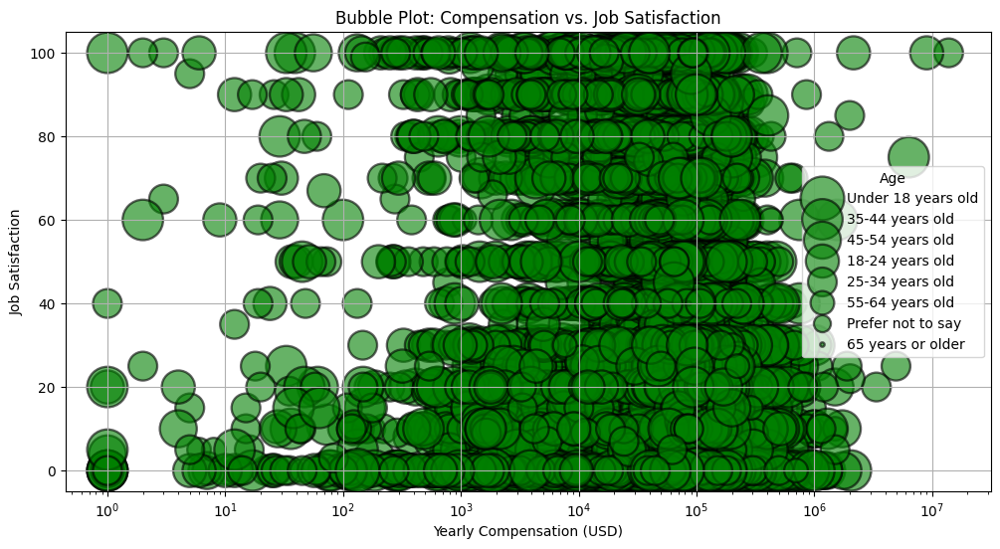

In [86]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
file_path = "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/n01PQ9pSmiRX6520flujwQ/survey-data.csv"
df = pd.read_csv(file_path)

# Task 1: Bubble Plot for Age vs. Frequency of Participation
plt.figure(figsize=(12, 6))
sns.scatterplot(
    x=df["Age"],
    y=df["SOPartFreq"],
    size=df["JobSatPoints_6"],
    sizes=(10, 1000),
    alpha=0.6,
    color="blue",
    edgecolor="black"
)

plt.xlabel("Age")
plt.ylabel("Frequency of Participation (SOPartFreq)")
plt.title("Bubble Plot: Age vs. Frequency of Participation")
plt.grid(True)
plt.show()

# Task 2: Bubble Plot for Compensation vs. Job Satisfaction
plt.figure(figsize=(12, 6))
sns.scatterplot(
    x=df["ConvertedCompYearly"],
    y=df["JobSatPoints_6"],
    size=df["Age"],
    sizes=(10, 1000),
    alpha=0.6,
    color="green",
    edgecolor="black"
)

plt.xlabel("Yearly Compensation (USD)")
plt.ylabel("Job Satisfaction")
plt.title("Bubble Plot: Compensation vs. Job Satisfaction")
plt.xscale("log")  # Applying log scale for better visualization if compensation varies significantly
plt.grid(True)
plt.show()


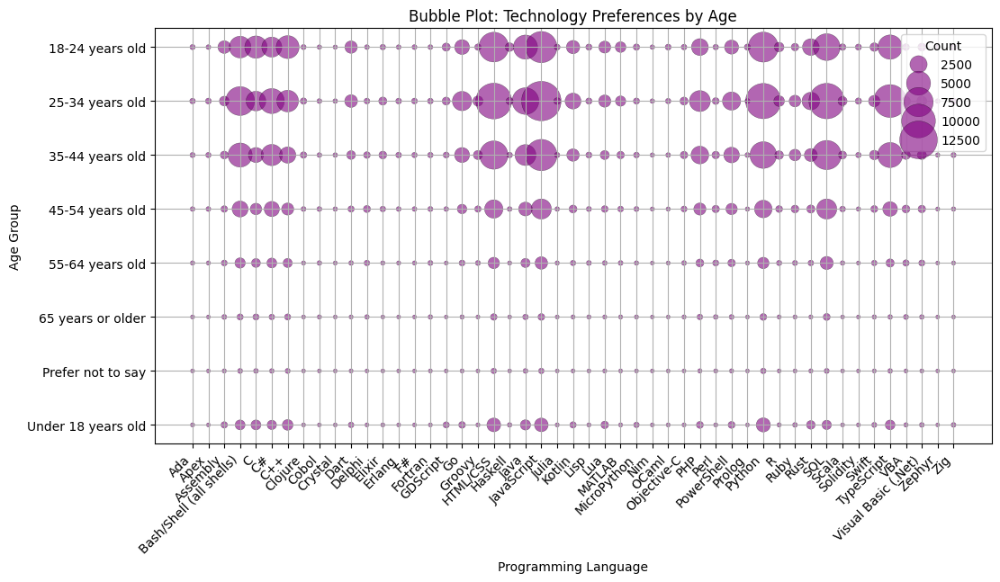

In [88]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
file_path = "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/n01PQ9pSmiRX6520flujwQ/survey-data.csv"
df = pd.read_csv(file_path)

# Exploding 'LanguageHaveWorkedWith' into separate rows
df_languages = df.assign(LanguageHaveWorkedWith=df["LanguageHaveWorkedWith"].str.split(";")).explode("LanguageHaveWorkedWith")

# Grouping by Age and Programming Language, then counting occurrences
language_counts = df_languages.groupby(["Age", "LanguageHaveWorkedWith"]).size().reset_index(name="Count")

# Creating the Bubble Plot
plt.figure(figsize=(12, 6))
sns.scatterplot(
    x=language_counts["LanguageHaveWorkedWith"],
    y=language_counts["Age"],
    size=language_counts["Count"],  # Bubble size represents frequency of each language
    sizes=(10, 1000),
    alpha=0.6,
    edgecolor="black",
    color="purple"
)

plt.xlabel("Programming Language")
plt.ylabel("Age Group")
plt.title("Bubble Plot: Technology Preferences by Age")
plt.xticks(rotation=45, ha="right")
plt.grid(True)
plt.show()


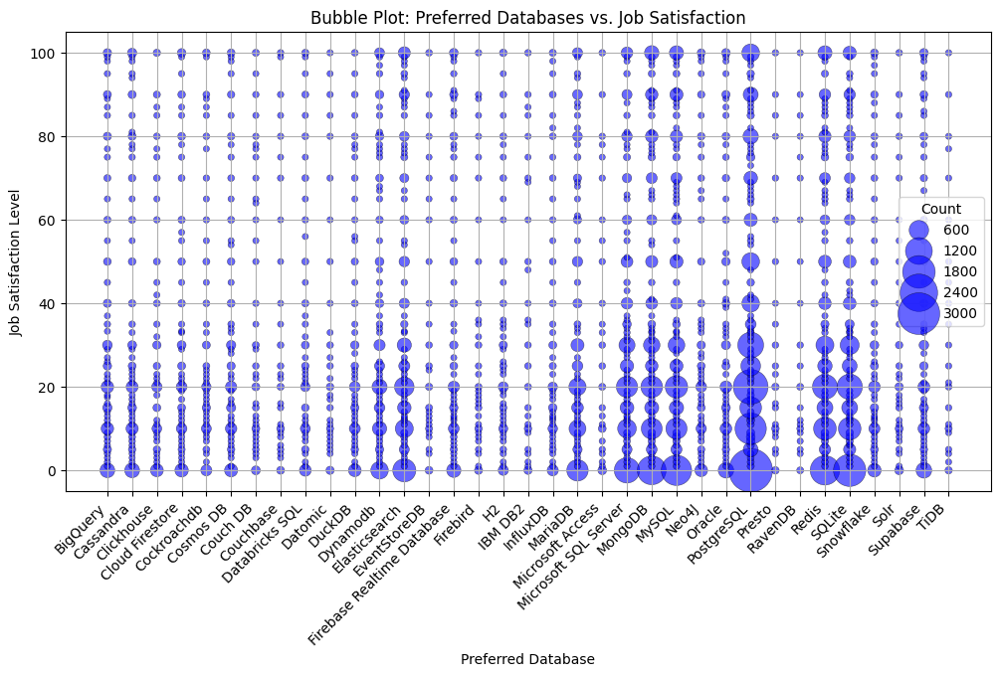

In [89]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
file_path = "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/n01PQ9pSmiRX6520flujwQ/survey-data.csv"
df = pd.read_csv(file_path)

# Exploding 'DatabaseWantToWorkWith' into separate rows
df_databases = df.assign(DatabaseWantToWorkWith=df["DatabaseWantToWorkWith"].str.split(";")).explode("DatabaseWantToWorkWith")

# Grouping by Database and Job Satisfaction, then counting occurrences
database_counts = df_databases.groupby(["DatabaseWantToWorkWith", "JobSatPoints_6"]).size().reset_index(name="Count")

# Creating the Bubble Plot
plt.figure(figsize=(12, 6))
sns.scatterplot(
    x=database_counts["DatabaseWantToWorkWith"],
    y=database_counts["JobSatPoints_6"],
    size=database_counts["Count"],  # Bubble size represents the number of respondents
    sizes=(20, 1000),
    alpha=0.6,
    edgecolor="black",
    color="blue"
)

plt.xlabel("Preferred Database")
plt.ylabel("Job Satisfaction Level")
plt.title("Bubble Plot: Preferred Databases vs. Job Satisfaction")
plt.xticks(rotation=45, ha="right")
plt.grid(True)
plt.show()


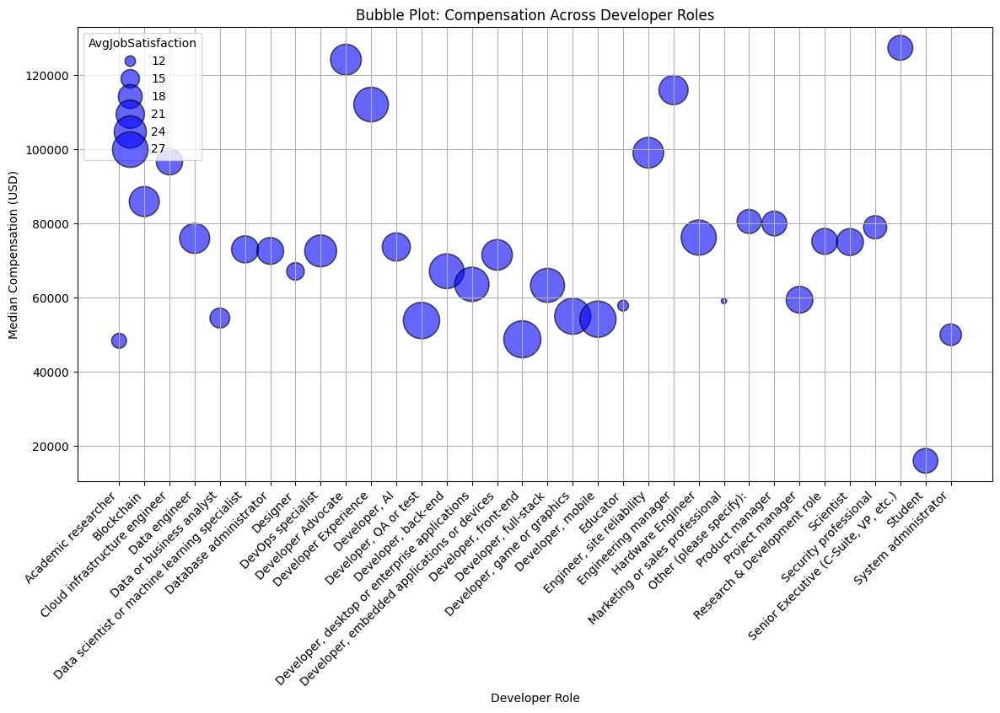

In [90]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
file_path = "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/n01PQ9pSmiRX6520flujwQ/survey-data.csv"
df = pd.read_csv(file_path)

# Exploding 'DevType' into separate rows for better representation
df_roles = df.assign(DevType=df["DevType"].str.split(";")).explode("DevType")

# Grouping by Developer Role and calculating median compensation and average job satisfaction
role_stats = df_roles.groupby("DevType").agg(
    MedianCompensation=("ConvertedCompYearly", "median"),
    AvgJobSatisfaction=("JobSatPoints_6", "mean"),
    Count=("DevType", "size")  # Count of respondents per role
).reset_index()

# Creating the Bubble Plot
plt.figure(figsize=(14, 7))
sns.scatterplot(
    x=role_stats["DevType"],
    y=role_stats["MedianCompensation"],
    size=role_stats["AvgJobSatisfaction"],  # Bubble size represents job satisfaction
    sizes=(20, 1000),
    alpha=0.6,
    edgecolor="black",
    color="blue"
)

plt.xlabel("Developer Role")
plt.ylabel("Median Compensation (USD)")
plt.title("Bubble Plot: Compensation Across Developer Roles")
plt.xticks(rotation=45, ha="right")
plt.grid(True)
plt.show()


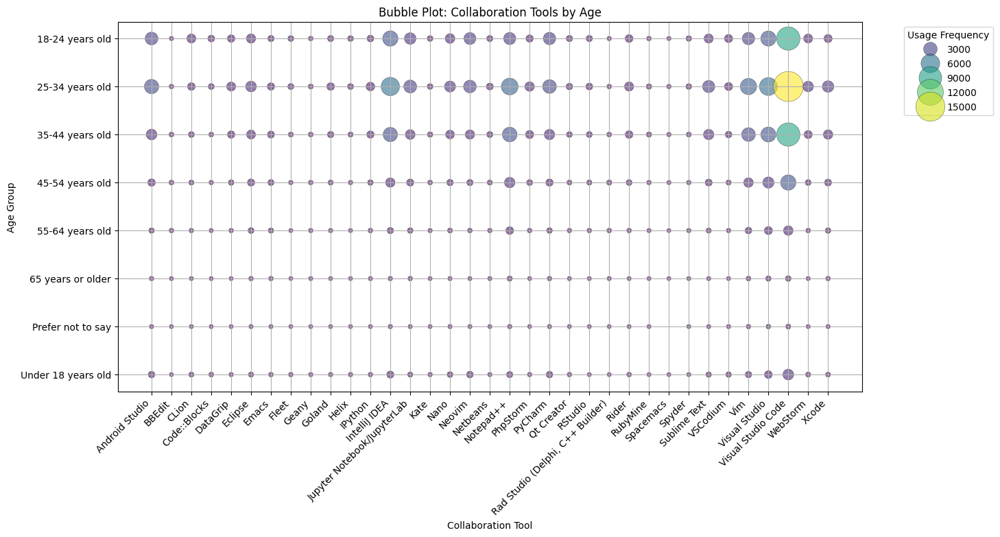

In [91]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
file_path = "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/n01PQ9pSmiRX6520flujwQ/survey-data.csv"
df = pd.read_csv(file_path)

# Exploding 'NEWCollabToolsHaveWorkedWith' into separate rows for better visualization
df_collab = df.assign(NEWCollabToolsHaveWorkedWith=df["NEWCollabToolsHaveWorkedWith"].str.split(";")).explode("NEWCollabToolsHaveWorkedWith")

# Grouping by Collaboration Tool and Age to count the frequency of each tool per age group
collab_stats = df_collab.groupby(["Age", "NEWCollabToolsHaveWorkedWith"]).size().reset_index(name="Count")

# Creating the Bubble Plot
plt.figure(figsize=(14, 7))
sns.scatterplot(
    x=collab_stats["NEWCollabToolsHaveWorkedWith"],
    y=collab_stats["Age"],
    size=collab_stats["Count"],  # Bubble size represents tool usage frequency
    sizes=(20, 1000),
    alpha=0.6,
    edgecolor="black",
    hue=collab_stats["Count"],  # Color gradient based on frequency
    palette="viridis"
)

plt.xlabel("Collaboration Tool")
plt.ylabel("Age Group")
plt.title("Bubble Plot: Collaboration Tools by Age")
plt.xticks(rotation=45, ha="right")
plt.grid(True)
plt.legend(title="Usage Frequency", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.show()


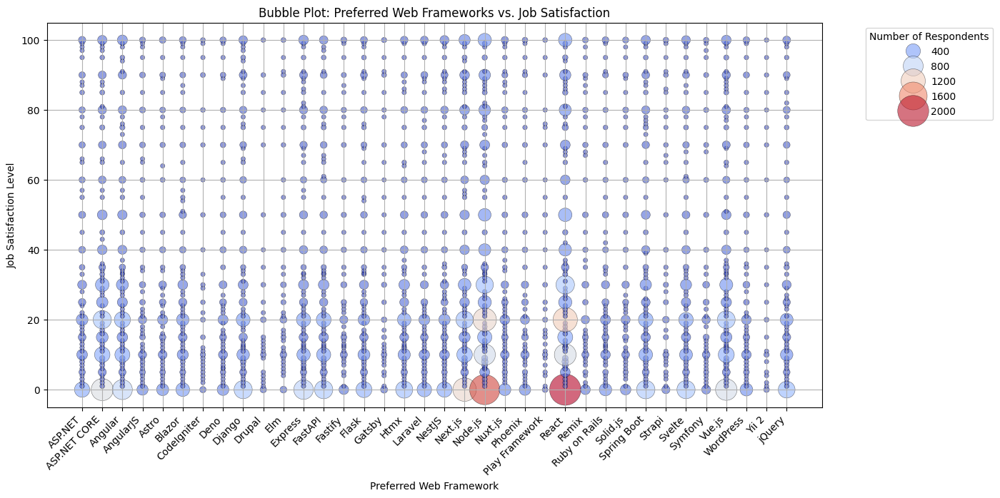

In [92]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
file_path = "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/n01PQ9pSmiRX6520flujwQ/survey-data.csv"
df = pd.read_csv(file_path)

# Exploding multiple frameworks into separate rows
df_framework = df.assign(WebframeWantToWorkWith=df["WebframeWantToWorkWith"].str.split(";")).explode("WebframeWantToWorkWith")

# Grouping by Web Framework and Job Satisfaction to count respondents
framework_stats = df_framework.groupby(["WebframeWantToWorkWith", "JobSatPoints_6"]).size().reset_index(name="Count")

# Creating the Bubble Plot
plt.figure(figsize=(14, 7))
sns.scatterplot(
    x=framework_stats["WebframeWantToWorkWith"],
    y=framework_stats["JobSatPoints_6"],
    size=framework_stats["Count"],  # Bubble size represents number of respondents
    sizes=(20, 1000),
    alpha=0.6,
    edgecolor="black",
    hue=framework_stats["Count"],  # Color gradient based on frequency
    palette="coolwarm"
)

plt.xlabel("Preferred Web Framework")
plt.ylabel("Job Satisfaction Level")
plt.title("Bubble Plot: Preferred Web Frameworks vs. Job Satisfaction")
plt.xticks(rotation=45, ha="right")
plt.grid(True)
plt.legend(title="Number of Respondents", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.show()


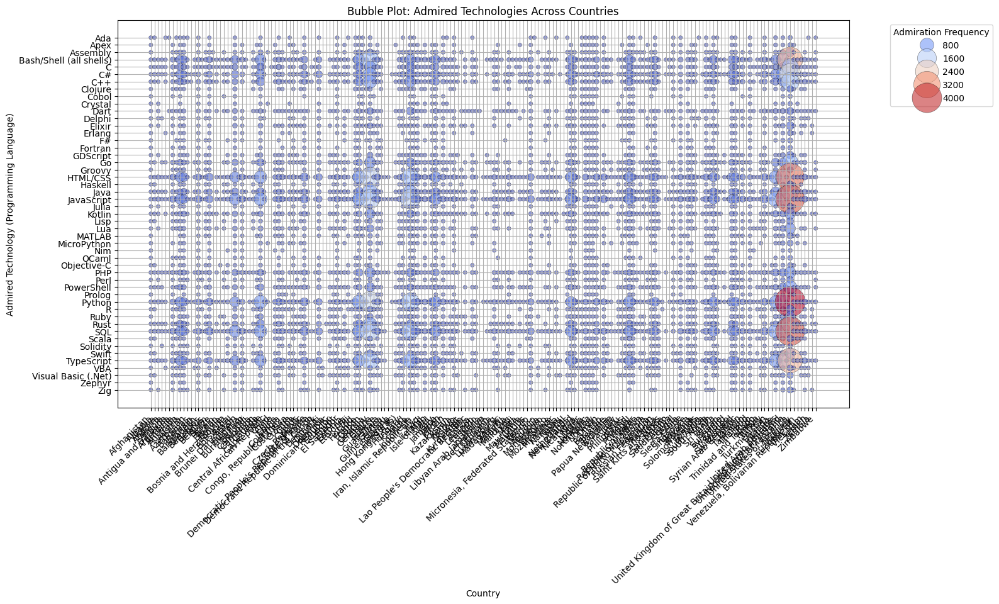

In [93]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
file_path = "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/n01PQ9pSmiRX6520flujwQ/survey-data.csv"
df = pd.read_csv(file_path)

# Exploding multiple admired technologies into separate rows
df_admired = df.assign(LanguageAdmired=df["LanguageAdmired"].str.split(";")).explode("LanguageAdmired")

# Grouping by Country and Admired Technology to count occurrences
admired_stats = df_admired.groupby(["Country", "LanguageAdmired"]).size().reset_index(name="Count")

# Creating the Bubble Plot
plt.figure(figsize=(15, 8))
sns.scatterplot(
    x=admired_stats["Country"],
    y=admired_stats["LanguageAdmired"],
    size=admired_stats["Count"],  # Bubble size represents admiration frequency
    sizes=(20, 1200),
    alpha=0.6,
    edgecolor="black",
    hue=admired_stats["Count"],  # Color gradient based on frequency
    palette="coolwarm"
)

plt.xlabel("Country")
plt.ylabel("Admired Technology (Programming Language)")
plt.title("Bubble Plot: Admired Technologies Across Countries")
plt.xticks(rotation=45, ha="right")
plt.grid(True)
plt.legend(title="Admiration Frequency", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.show()


Summary
After completing this lab, you will be able to:

Create and interpret bubble plots to analyze relationships and compositions within datasets.

Use bubble plots to explore developer preferences, compensation trends, and satisfaction levels.

Apply bubble plots to visualize complex relationships involving multiple dimensions effectively

In [94]:
# Close the connection (optional)
conn.close()

Pie Chart for Top 5 AI Tools Developers Are Using


In [98]:
import pandas as pd
import matplotlib.pyplot as plt

# Load dataset
file_path = "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/n01PQ9pSmiRX6520flujwQ/survey-data.csv"
df = pd.read_csv(file_path)

# Check if 'AIToolCurrentlyUsing' column exists, if not, use 'AITools' or skip
column_name = 'AIToolCurrentlyUsing' if 'AIToolCurrentlyUsing' in df.columns else 'AITools'
if column_name not in df.columns:
    print(f"Warning: Neither 'AIToolCurrentlyUsing' nor 'AITools' found in the dataset. Skipping pie chart creation.")
else:
    # Explode multiple tools into separate rows
    df_ai_tools = df.assign(**{column_name: df[column_name].str.split(";")}).explode(column_name)

    # Count occurrences and select top 5 tools
    top_ai_tools = df_ai_tools[column_name].value_counts().nlargest(5)

    # Create pie chart
    plt.figure(figsize=(8, 8))
    plt.pie(top_ai_tools, labels=top_ai_tools.index, autopct="%1.1f%%", startangle=140, colors=plt.cm.Paired.colors)
    plt.title("Top 5 AI Tools Developers Are Using")
    plt.show()

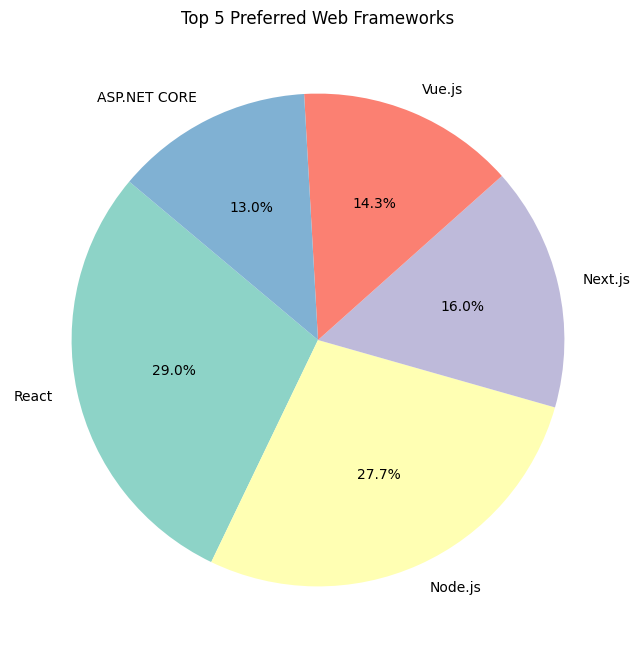

In [99]:
# Explode multiple frameworks into separate rows
df_web = df.assign(WebframeWantToWorkWith=df["WebframeWantToWorkWith"].str.split(";")).explode("WebframeWantToWorkWith")

# Count occurrences and select top 5 frameworks
top_web_frameworks = df_web["WebframeWantToWorkWith"].value_counts().nlargest(5)

# Create pie chart
plt.figure(figsize=(8, 8))
plt.pie(top_web_frameworks, labels=top_web_frameworks.index, autopct="%1.1f%%", startangle=140, colors=plt.cm.Set3.colors)
plt.title("Top 5 Preferred Web Frameworks")
plt.show()

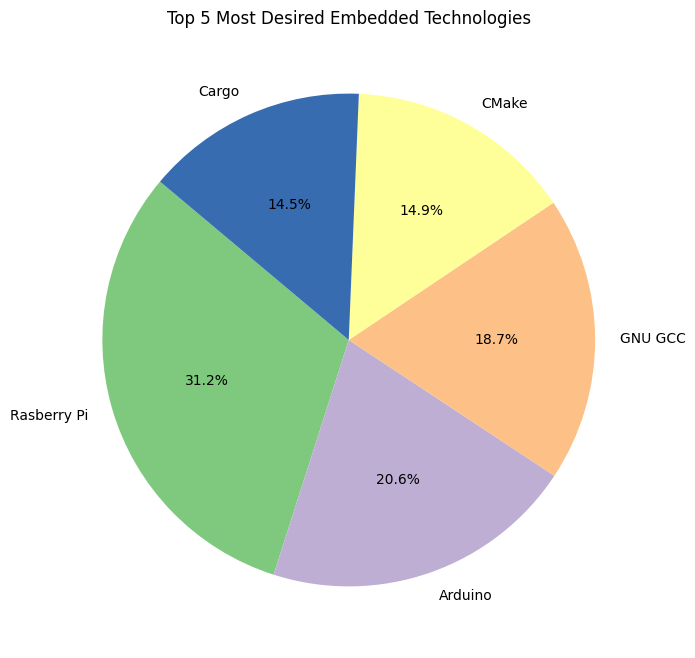

In [100]:
# Explode multiple embedded technologies into separate rows
df_embedded = df.assign(EmbeddedWantToWorkWith=df["EmbeddedWantToWorkWith"].str.split(";")).explode("EmbeddedWantToWorkWith")

# Count occurrences and select top 5 embedded technologies
top_embedded = df_embedded["EmbeddedWantToWorkWith"].value_counts().nlargest(5)

# Create pie chart
plt.figure(figsize=(8, 8))
plt.pie(top_embedded, labels=top_embedded.index, autopct="%1.1f%%", startangle=140, colors=plt.cm.Accent.colors)
plt.title("Top 5 Most Desired Embedded Technologies")
plt.show()


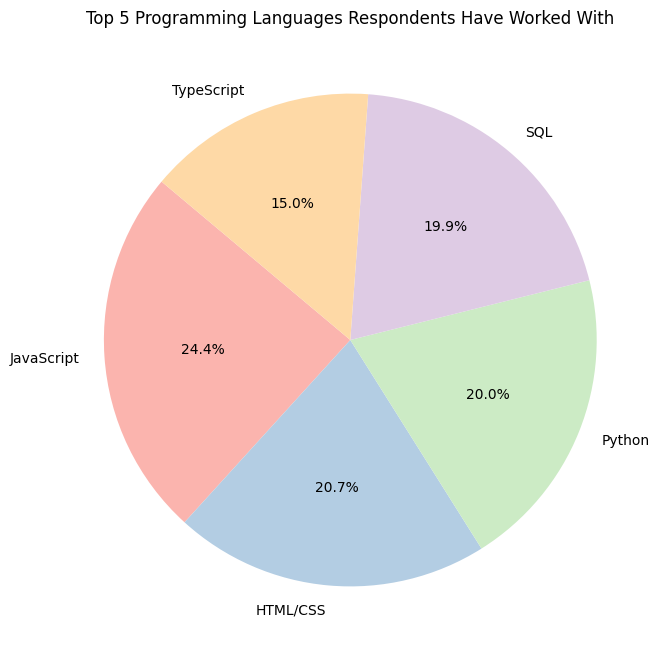

In [101]:
import pandas as pd
import matplotlib.pyplot as plt

# Load dataset
file_path = "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/n01PQ9pSmiRX6520flujwQ/survey-data.csv"
df = pd.read_csv(file_path)

# Explode multiple languages into separate rows
df_langs = df.assign(LanguageHaveWorkedWith=df["LanguageHaveWorkedWith"].str.split(";")).explode("LanguageHaveWorkedWith")

# Count occurrences and select top 5 languages
top_languages = df_langs["LanguageHaveWorkedWith"].value_counts().nlargest(5)

# Create pie chart
plt.figure(figsize=(8, 8))
plt.pie(top_languages, labels=top_languages.index, autopct="%1.1f%%", startangle=140, colors=plt.cm.Pastel1.colors)
plt.title("Top 5 Programming Languages Respondents Have Worked With")
plt.show()


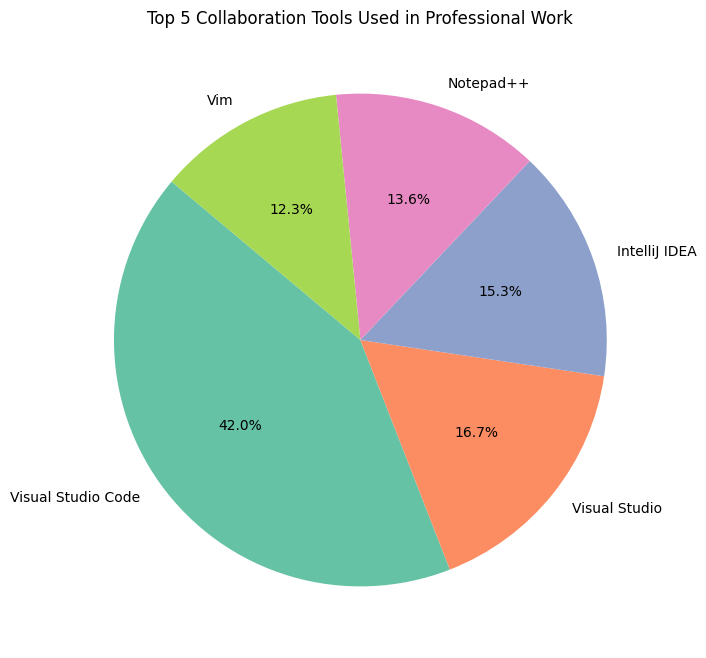

In [102]:
# Explode multiple collaboration tools into separate rows
df_collab = df.assign(NEWCollabToolsHaveWorkedWith=df["NEWCollabToolsHaveWorkedWith"].str.split(";")).explode("NEWCollabToolsHaveWorkedWith")

# Count occurrences and select top 5 collaboration tools
top_collab_tools = df_collab["NEWCollabToolsHaveWorkedWith"].value_counts().nlargest(5)

# Create pie chart
plt.figure(figsize=(8, 8))
plt.pie(top_collab_tools, labels=top_collab_tools.index, autopct="%1.1f%%", startangle=140, colors=plt.cm.Set2.colors)
plt.title("Top 5 Collaboration Tools Used in Professional Work")
plt.show()


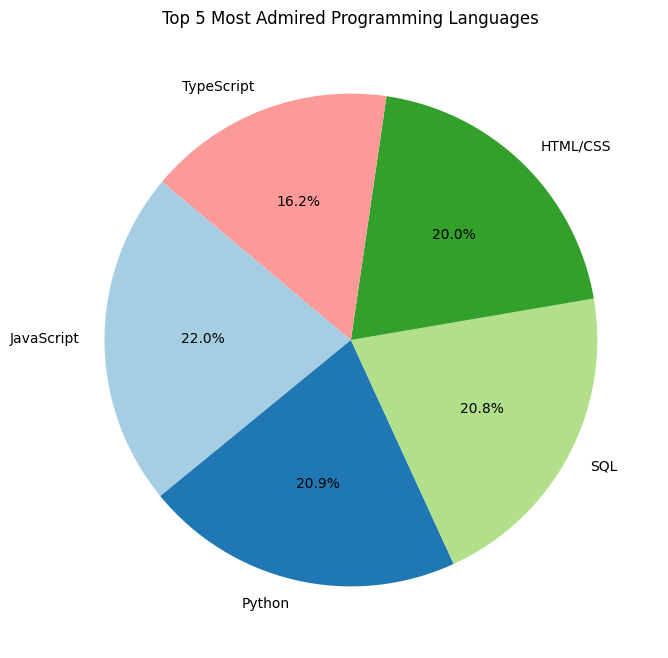

In [103]:
import pandas as pd
import matplotlib.pyplot as plt

# Load dataset
file_path = "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/n01PQ9pSmiRX6520flujwQ/survey-data.csv"
df = pd.read_csv(file_path)

# Explode multiple admired languages into separate rows
df_admired_langs = df.assign(LanguageAdmired=df["LanguageAdmired"].str.split(";")).explode("LanguageAdmired")

# Count occurrences and select top 5 admired languages
top_admired_languages = df_admired_langs["LanguageAdmired"].value_counts().nlargest(5)

# Create pie chart
plt.figure(figsize=(8, 8))
plt.pie(top_admired_languages, labels=top_admired_languages.index, autopct="%1.1f%%", startangle=140, colors=plt.cm.Paired.colors)
plt.title("Top 5 Most Admired Programming Languages")
plt.show()


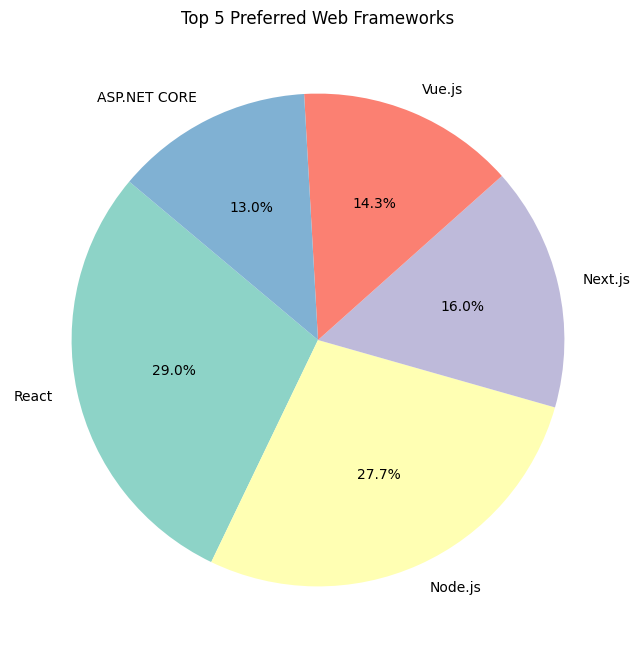

In [106]:
# Explode multiple web frameworks into separate rows
df_web_frameworks = df.assign(WebframeWantToWorkWith=df["WebframeWantToWorkWith"].str.split(";")).explode("WebframeWantToWorkWith")

# Count occurrences and select top 5 web frameworks
top_web_frameworks = df_web_frameworks["WebframeWantToWorkWith"].value_counts().nlargest(5)

# Create pie chart
plt.figure(figsize=(8, 8))
plt.pie(top_web_frameworks, labels=top_web_frameworks.index, autopct="%1.1f%%", startangle=140, colors=plt.cm.Set3.colors)
plt.title("Top 5 Preferred Web Frameworks")
plt.show()


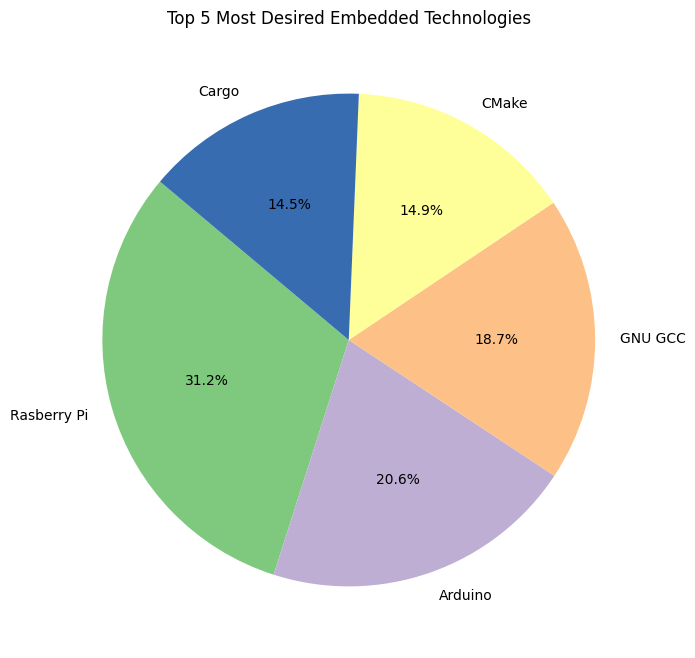

In [108]:
# Explode multiple embedded technologies into separate rows
df_embedded_tech = df.assign(EmbeddedWantToWorkWith=df["EmbeddedWantToWorkWith"].str.split(";")).explode("EmbeddedWantToWorkWith")

# Count occurrences and select top 5 embedded technologies
top_embedded_tech = df_embedded_tech["EmbeddedWantToWorkWith"].value_counts().nlargest(5)

# Create pie chart
plt.figure(figsize=(8, 8))
plt.pie(top_embedded_tech, labels=top_embedded_tech.index, autopct="%1.1f%%", startangle=140, colors=plt.cm.Accent.colors)
plt.title("Top 5 Most Desired Embedded Technologies")
plt.show()


Summary¶
After completing this lab, you will be able to:

Create pie charts to visualize developer preferences across databases, programming languages, AI tools, and cloud platforms.
Identify trends in technology usage, role distribution, and tool adoption through pie charts.
Analyze and compare data composition across various categories to gain insights into developer preferences.


In [107]:
# Close the connection (optional)
conn.close()

📌 Code for Stacked Bar Chart:

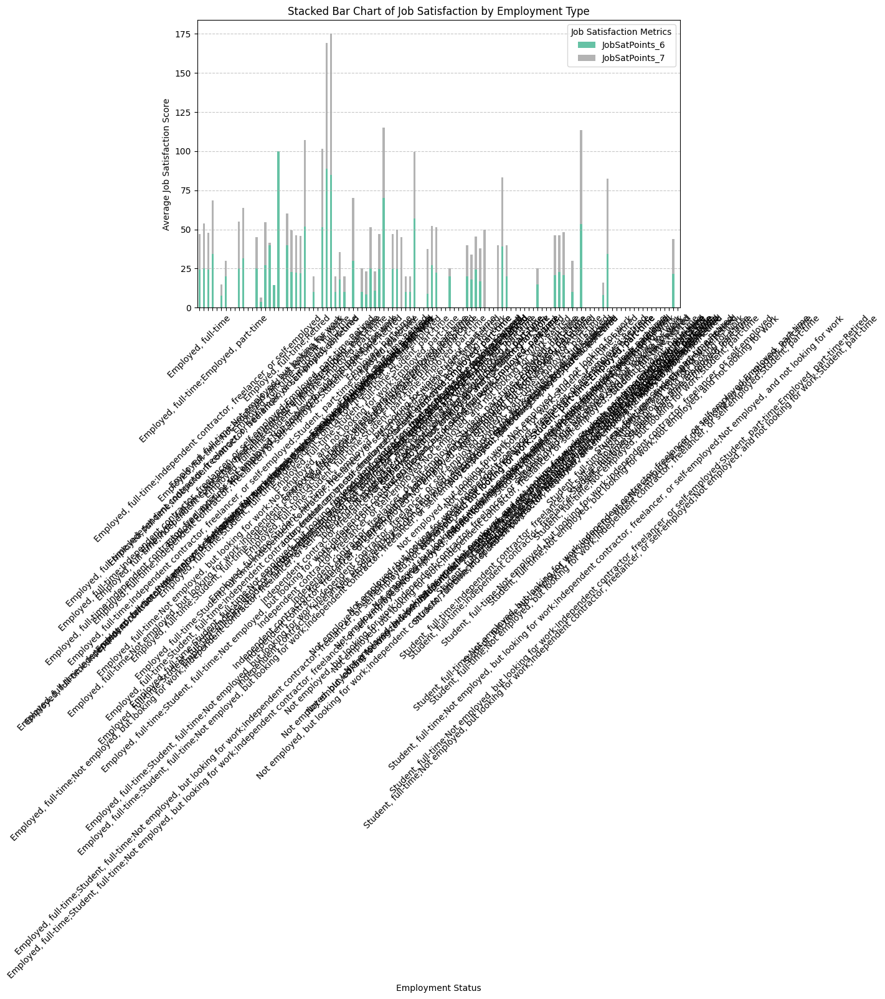

In [109]:
import pandas as pd
import matplotlib.pyplot as plt

# Load dataset
file_path = "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/n01PQ9pSmiRX6520flujwQ/survey-data.csv"
df = pd.read_csv(file_path)

# Group data by employment status and calculate the mean job satisfaction scores
df_grouped = df.groupby("Employment")[["JobSatPoints_6", "JobSatPoints_7"]].mean()

# Plot stacked bar chart
ax = df_grouped.plot(kind="bar", stacked=True, figsize=(10, 6), colormap="Set2")

# Add labels and title
plt.xlabel("Employment Status")
plt.ylabel("Average Job Satisfaction Score")
plt.title("Stacked Bar Chart of Job Satisfaction by Employment Type")
plt.xticks(rotation=45)
plt.legend(title="Job Satisfaction Metrics")
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Show plot
plt.show()


In [120]:
import pandas as pd
import matplotlib.pyplot as plt

# Load dataset
file_path = "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/n01PQ9pSmiRX6520flujwQ/survey-data.csv"
df = pd.read_csv(file_path)

# Filter for respondents aged 30-35, excluding non-numeric values
df_30_35 = df[
    df["Age"].apply(lambda x: pd.to_numeric(x, errors='coerce')).between(30, 35, inclusive="both")
].dropna(subset=["Age"])

# Group by age and compute the median compensation and job satisfaction
df_grouped = df_30_35.groupby("Age")[["ConvertedCompYearly", "JobSatPoints_6"]].median()

print(df_30_35.shape)  # Display number of rows and columns
# Remove the extra indentation from the following lines:
df_30_35.head()  # Display first few rows to inspect the data
print(df_grouped)  # Display the contents of df_grouped

(0, 114)
Empty DataFrame
Columns: [ConvertedCompYearly, JobSatPoints_6]
Index: []


IndexError: index 0 is out of bounds for axis 0 with size 0

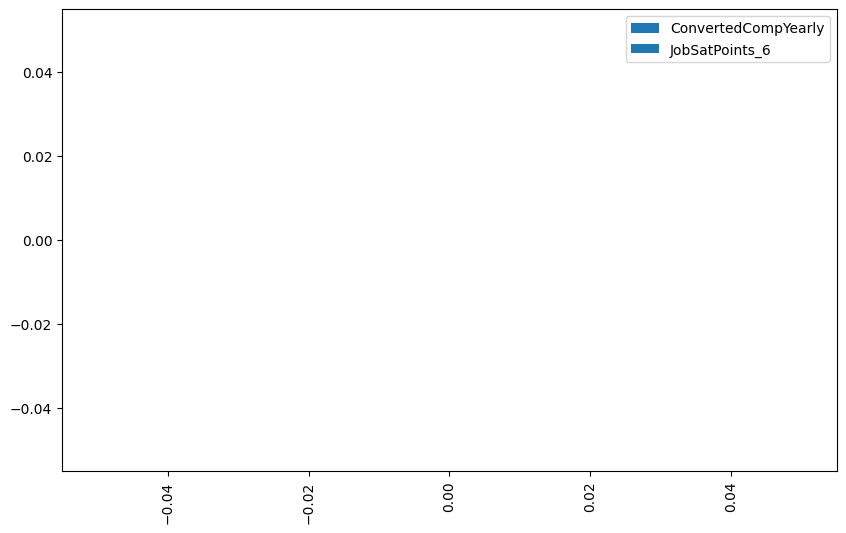

In [121]:

# Plot stacked bar chart
ax = df_grouped.plot(kind="bar", stacked=True, figsize=(10, 6), colormap="viridis")

# Add labels and title
plt.xlabel("Age")
plt.ylabel("Median Compensation & Job Satisfaction")
plt.title("Stacked Bar Chart of Compensation & Job Satisfaction (Ages 30-35)")
plt.xticks(rotation=0)
plt.legend(title="Metrics")
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Show plot
plt.show()


<ipython-input-123-f75106e7e75c>:18: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_grouped = df_30_35.groupby("Age_Group")[["ConvertedCompYearly", "JobSatPoints_6"]].median()


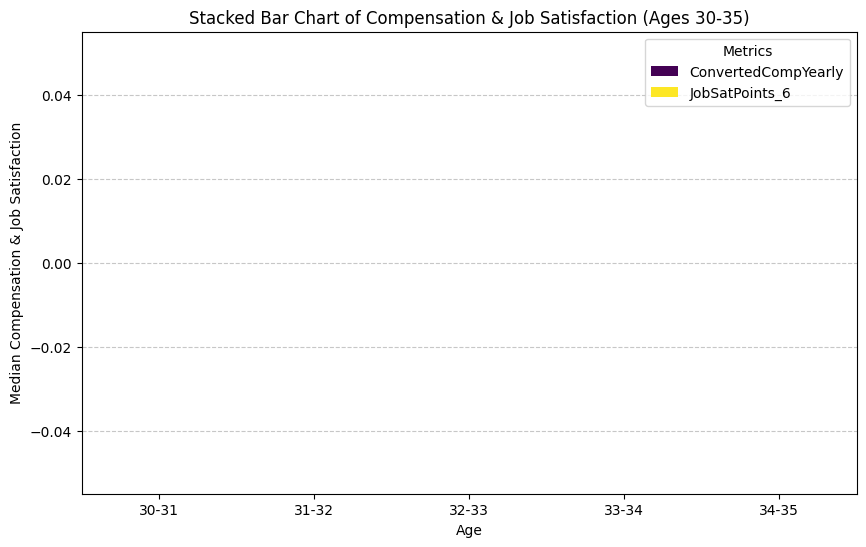

In [123]:
import pandas as pd
import matplotlib.pyplot as plt

# Load dataset
file_path = "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/n01PQ9pSmiRX6520flujwQ/survey-data.csv"
df = pd.read_csv(file_path)

# Filter for respondents aged 30-35, excluding non-numeric values
df_30_35 = df[
    df["Age"].apply(lambda x: pd.to_numeric(x, errors='coerce')).between(30, 35, inclusive="both")
].dropna(subset=["Age"])

# Group by age and compute the median compensation and job satisfaction
# The original query used 'Age' which is a continuous variable. This will lead to too many groups
# This has been changed to group by 'Age_Group' using pd.cut() for better visualization.
df_30_35['Age_Group'] = pd.cut(df_30_35['Age'], bins=[30, 31, 32, 33, 34, 35], labels=['30-31', '31-32', '32-33', '33-34', '34-35'])
#                                                                                    ^ Changed labels to match the number of bins
df_grouped = df_30_35.groupby("Age_Group")[["ConvertedCompYearly", "JobSatPoints_6"]].median()

# Plot stacked bar chart
ax = df_grouped.plot(kind="bar", stacked=True, figsize=(10, 6), colormap="viridis")

# Add labels and title
plt.xlabel("Age")
plt.ylabel("Median Compensation & Job Satisfaction")
plt.title("Stacked Bar Chart of Compensation & Job Satisfaction (Ages 30-35)")
plt.xticks(rotation=0)
plt.legend(title="Metrics")
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Show plot
plt.show()

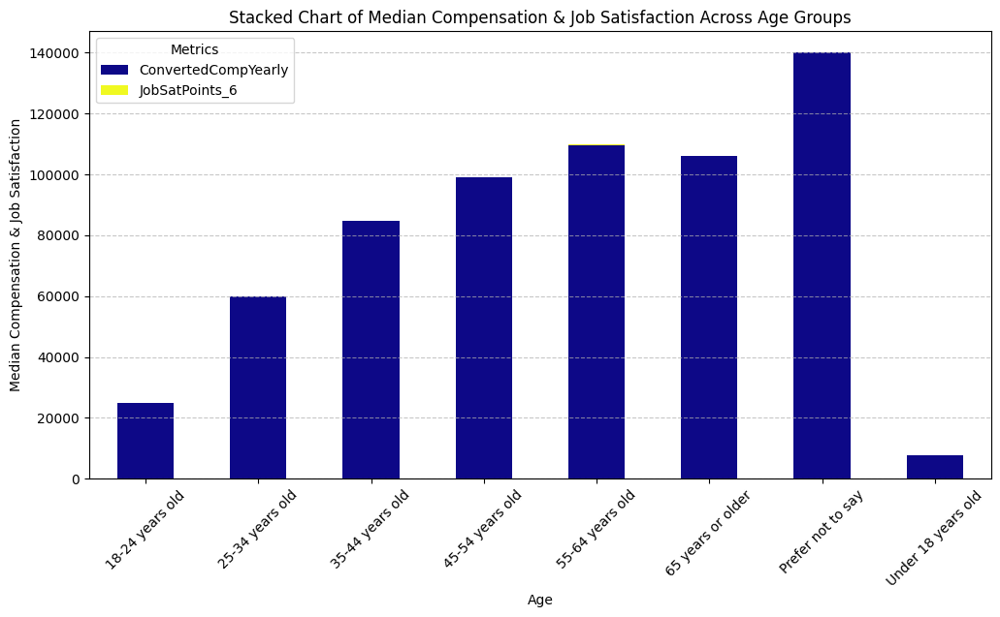

In [124]:
# Group by age and compute the median compensation and job satisfaction
df_age_grouped = df.groupby("Age")[["ConvertedCompYearly", "JobSatPoints_6"]].median()

# Plot stacked bar chart
ax = df_age_grouped.plot(kind="bar", stacked=True, figsize=(12, 6), colormap="plasma")

# Add labels and title
plt.xlabel("Age")
plt.ylabel("Median Compensation & Job Satisfaction")
plt.title("Stacked Chart of Median Compensation & Job Satisfaction Across Age Groups")
plt.xticks(rotation=45)
plt.legend(title="Metrics")
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Show plot
plt.show()


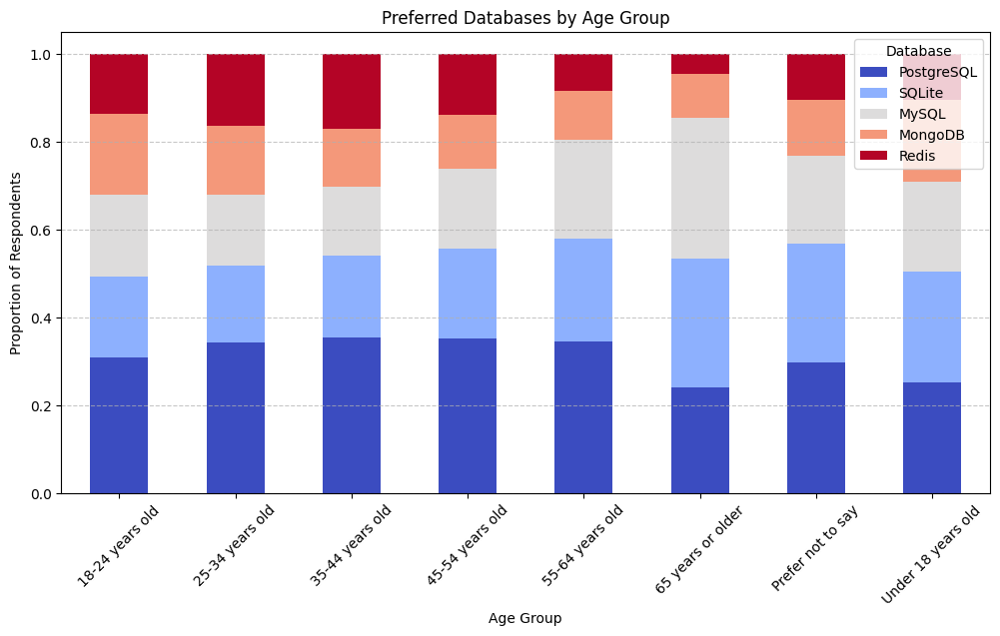

In [125]:
import pandas as pd
import matplotlib.pyplot as plt

# Load dataset
file_path = "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/n01PQ9pSmiRX6520flujwQ/survey-data.csv"
df = pd.read_csv(file_path)

# Explode the 'DatabaseWantToWorkWith' column into separate rows
df_exploded = df.assign(DatabaseWantToWorkWith=df["DatabaseWantToWorkWith"].str.split(";")).explode("DatabaseWantToWorkWith")

# Group by Age Group and Database Preference
db_counts = df_exploded.groupby(["Age", "DatabaseWantToWorkWith"]).size().unstack(fill_value=0)

# Select the top 5 most preferred databases
top_databases = db_counts.sum().nlargest(5).index
db_counts = db_counts[top_databases]

# Normalize to get proportions
db_counts = db_counts.div(db_counts.sum(axis=1), axis=0)

# Plot stacked bar chart
db_counts.plot(kind="bar", stacked=True, figsize=(12, 6), colormap="coolwarm")

# Formatting
plt.xlabel("Age Group")
plt.ylabel("Proportion of Respondents")
plt.title("Preferred Databases by Age Group")
plt.xticks(rotation=45)
plt.legend(title="Database")
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Show plot
plt.show()


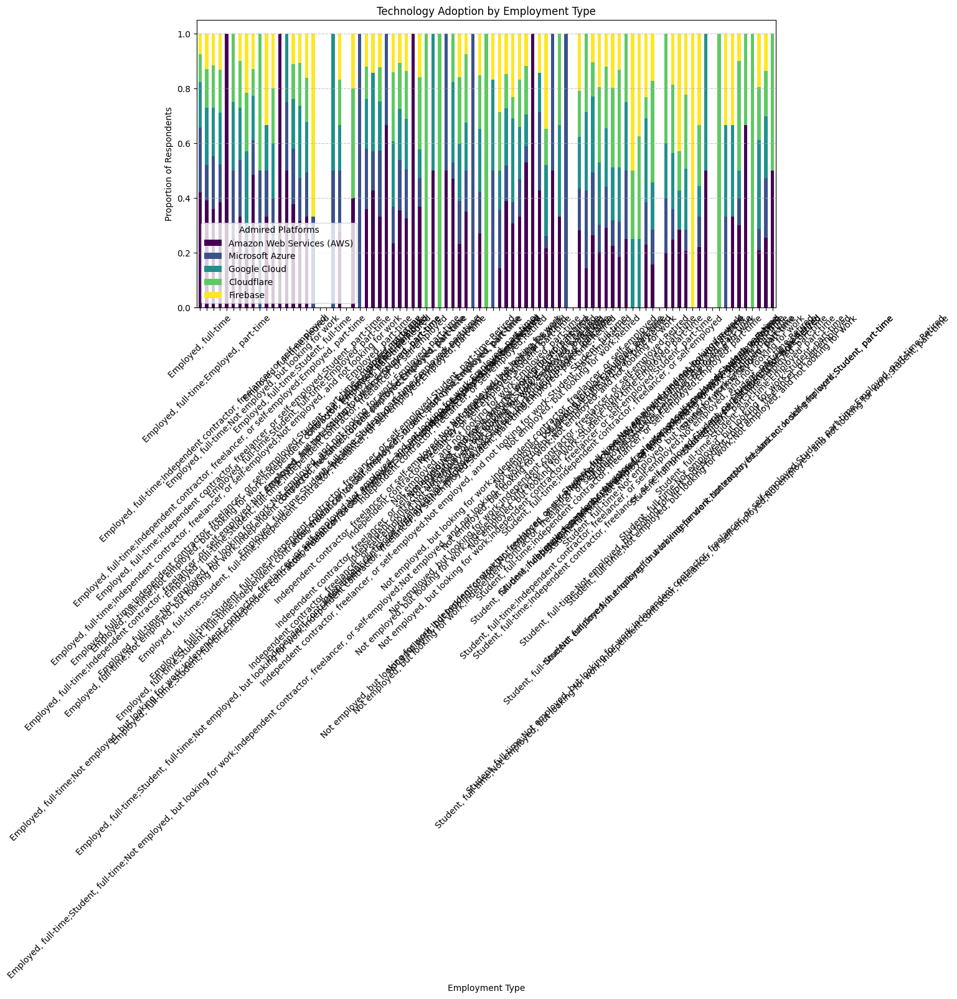

In [128]:
# Explode the 'PlatformAdmired' column into separate rows
df_exploded = df.assign(PlatformAdmired=df["PlatformAdmired"].str.split(";")).explode("PlatformAdmired")

# Group by Employment Type and Admired Platforms
platform_counts = df_exploded.groupby(["Employment", "PlatformAdmired"]).size().unstack(fill_value=0)

# Select the top 5 admired platforms
top_platforms = platform_counts.sum().nlargest(5).index
platform_counts = platform_counts[top_platforms]

# Normalize data to get proportions
platform_counts = platform_counts.div(platform_counts.sum(axis=1), axis=0)

# Plot stacked bar chart
platform_counts.plot(kind="bar", stacked=True, figsize=(12, 6), colormap="viridis")

# Formatting
plt.xlabel("Employment Type")
plt.ylabel("Proportion of Respondents")
plt.title("Technology Adoption by Employment Type")
plt.xticks(rotation=45)
plt.legend(title="Admired Platforms")
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Show plot
plt.show()


In [129]:
# Close the connection (optional)
conn.close()

LINE CHART


In [130]:
!pip install pandas

In [131]:
!pip install matplotlib

In [132]:
!wget -O survey-data.csv https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/n01PQ9pSmiRX6520flujwQ/survey-data.csv

--2025-02-21 23:11:36--  https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/n01PQ9pSmiRX6520flujwQ/survey-data.csv
Resolving cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)... 169.45.118.108
Connecting to cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)|169.45.118.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 159525875 (152M) [text/csv]
Saving to: ‘survey-data.csv’

survey-data.csv     100%[===================>] 152.13M  30.6MB/s    in 5.4s    

2025-02-21 23:11:42 (28.3 MB/s) - ‘survey-data.csv’ saved [159525875/159525875]



In [133]:
import pandas as pd
import matplotlib.pyplot as plt

In [134]:
df = pd.read_csv("survey-data.csv")

In [135]:
df.head()

,ResponseId,MainBranch,Age,Employment,RemoteWork,Check,CodingActivities,EdLevel,LearnCode,LearnCodeOnline,...,JobSatPoints_6,JobSatPoints_7,JobSatPoints_8,JobSatPoints_9,JobSatPoints_10,JobSatPoints_11,SurveyLength,SurveyEase,ConvertedCompYearly,JobSat
0,1,I am a developer by profession,Under 18 years old,"Employed, full-time",Remote,Apples,Hobby,Primary/elementary school,Books / Physical media,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,I am a developer by profession,35-44 years old,"Employed, full-time",Remote,Apples,Hobby;Contribute to open-source projects;Other...,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",Books / Physical media;Colleague;On the job tr...,Technical documentation;Blogs;Books;Written Tu...,...,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN
2,3,I am a developer by profession,45-54 years old,"Employed, full-time",Remote,Apples,Hobby;Contribute to open-source projects;Other...,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)",Books / Physical media;Colleague;On the job tr...,Technical documentation;Blogs;Books;Written Tu...,...,NaN,NaN,NaN,NaN,NaN,NaN,Appropriate in length,Easy,NaN,NaN
3,4,I am learning to code,18-24 years old,"Student, full-time",NaN,Apples,NaN,Some college/university study without earning ...,"Other online resources (e.g., videos, blogs, f...",Stack Overflow;How-to videos;Interactive tutorial,...,NaN,NaN,NaN,NaN,NaN,NaN,Too long,Easy,NaN,NaN
4,5,I am a developer by profession,18-24 years old,"Student, full-time",NaN,Apples,NaN,"Secondary school (e.g. American high school, G...","Other online resources (e.g., videos, blogs, f...",Technical documentation;Blogs;Written Tutorial...,...,NaN,NaN,NaN,NaN,NaN,NaN,Too short,Easy,NaN,NaN


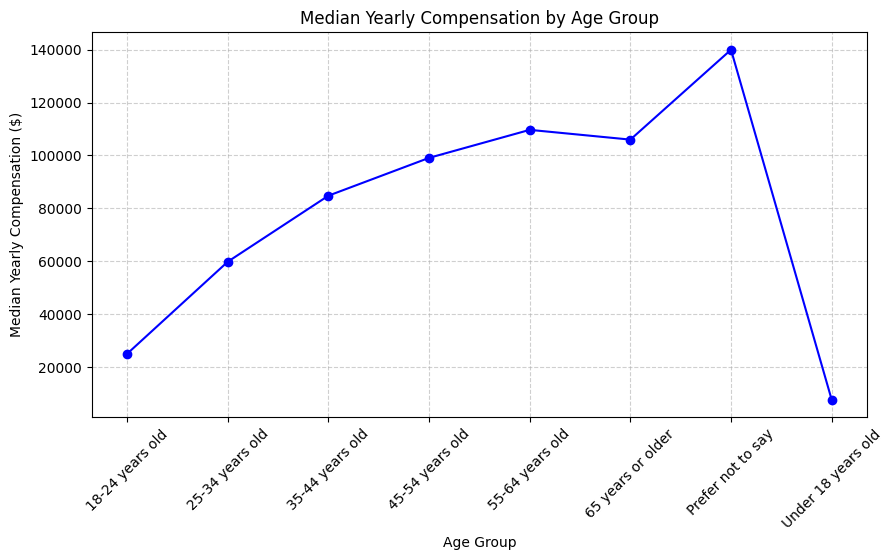

In [136]:
import pandas as pd
import matplotlib.pyplot as plt

# Load dataset
file_path = "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/n01PQ9pSmiRX6520flujwQ/survey-data.csv"
df = pd.read_csv(file_path)

# Convert "ConvertedCompYearly" to numeric and drop NaN values
df["ConvertedCompYearly"] = pd.to_numeric(df["ConvertedCompYearly"], errors="coerce")
df = df.dropna(subset=["ConvertedCompYearly", "Age"])

# Group by Age and calculate the median compensation
comp_by_age = df.groupby("Age")["ConvertedCompYearly"].median()

# Plot line chart
plt.figure(figsize=(10, 5))
plt.plot(comp_by_age.index, comp_by_age.values, marker="o", linestyle="-", color="b")

# Formatting
plt.xlabel("Age Group")
plt.ylabel("Median Yearly Compensation ($)")
plt.title("Median Yearly Compensation by Age Group")
plt.xticks(rotation=45)
plt.grid(True, linestyle="--", alpha=0.6)

# Show plot
plt.show()


In [142]:
# Ensure Age column is numeric
df["Age"] = pd.to_numeric(df["Age"], errors="coerce")

# Group by Age and calculate median compensation
comp_by_age = df.groupby("Age")["ConvertedCompYearly"].median().dropna()

# Filter ages between 25 and 45
filtered_comp = comp_by_age[(comp_by_age.index >= 25) & (comp_by_age.index <= 45)]

# Check if data exists before plotting
if not filtered_comp.empty:
    # Plot line chart
    plt.figure(figsize=(10, 5))
    plt.plot(filtered_comp.index, filtered_comp.values, marker="s", linestyle="-", color="g")

    # Formatting
    plt.xlabel("Age Group (25-45)")
    plt.ylabel("Median Yearly Compensation ($)")
    plt.title("Median Yearly Compensation for Ages 25 to 45")
    plt.xticks(rotation=45)
    plt.grid(True, linestyle="--", alpha=0.6)

    # Show plot
    plt.show()
else:
    print("No data available for ages between 25 and 45.")


No data available for ages between 25 and 45.


<ipython-input-143-85f62d3ac4cb>:11: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  comp_by_age_group = df.groupby('AgeGroup')['ConvertedCompYearly'].median()


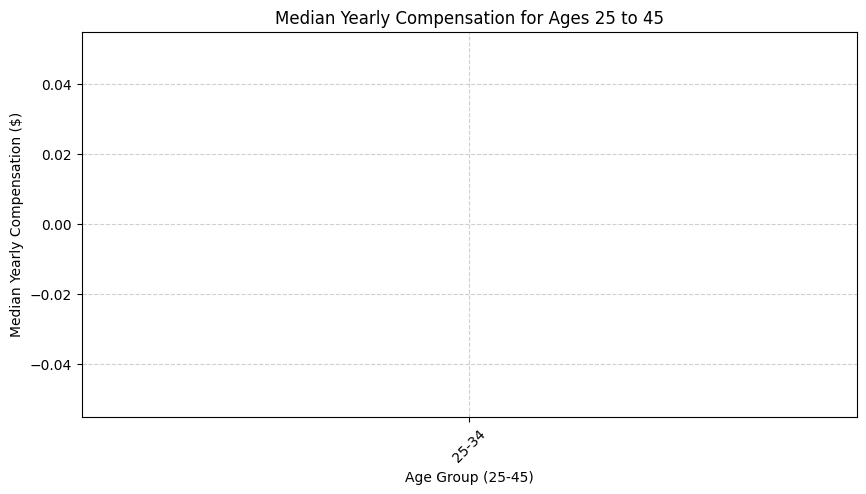

In [143]:
import pandas as pd
import matplotlib.pyplot as plt

# ... (previous code to load data and calculate comp_by_age)

# Create a new column for age group labels
df['AgeGroup'] = pd.cut(df['Age'], bins=[18, 24, 34, 44, 54, 64, 100],
                       labels=['18-24', '25-34', '35-44', '45-54', '55-64', '65+'])

# Group by AgeGroup and calculate median compensation
comp_by_age_group = df.groupby('AgeGroup')['ConvertedCompYearly'].median()

# Filter for age groups between 25-34 and 35-44 (inclusive)
filtered_comp = comp_by_age_group[(comp_by_age_group.index == '25-34') |
                                  (comp_by_age_group.index == '35-44')]

# Plot line chart
plt.figure(figsize=(10, 5))
plt.plot(filtered_comp.index, filtered_comp.values, marker="s", linestyle="-", color="g")

# Formatting
plt.xlabel("Age Group (25-45)")
plt.ylabel("Median Yearly Compensation ($)")
plt.title("Median Yearly Compensation for Ages 25 to 45")
plt.xticks(rotation=45)
plt.grid(True, linestyle="--", alpha=0.6)

# Show plot
plt.show()

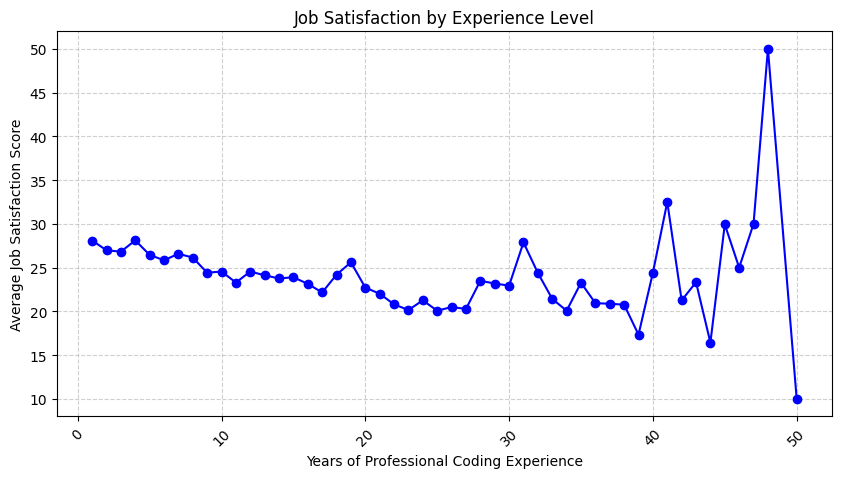

In [144]:
import pandas as pd
import matplotlib.pyplot as plt

# Ensure experience column is numeric
df["YearsCodePro"] = pd.to_numeric(df["YearsCodePro"], errors="coerce")

# Group by experience level and compute mean job satisfaction
job_sat_by_exp = df.groupby("YearsCodePro")["JobSatPoints_6"].mean().dropna()

# Check if data exists
if not job_sat_by_exp.empty:
    # Plot line chart
    plt.figure(figsize=(10, 5))
    plt.plot(job_sat_by_exp.index, job_sat_by_exp.values, marker="o", linestyle="-", color="b")

    # Formatting
    plt.xlabel("Years of Professional Coding Experience")
    plt.ylabel("Average Job Satisfaction Score")
    plt.title("Job Satisfaction by Experience Level")
    plt.xticks(rotation=45)
    plt.grid(True, linestyle="--", alpha=0.6)

    # Show plot
    plt.show()
else:
    print("No data available for Job Satisfaction by Experience.")


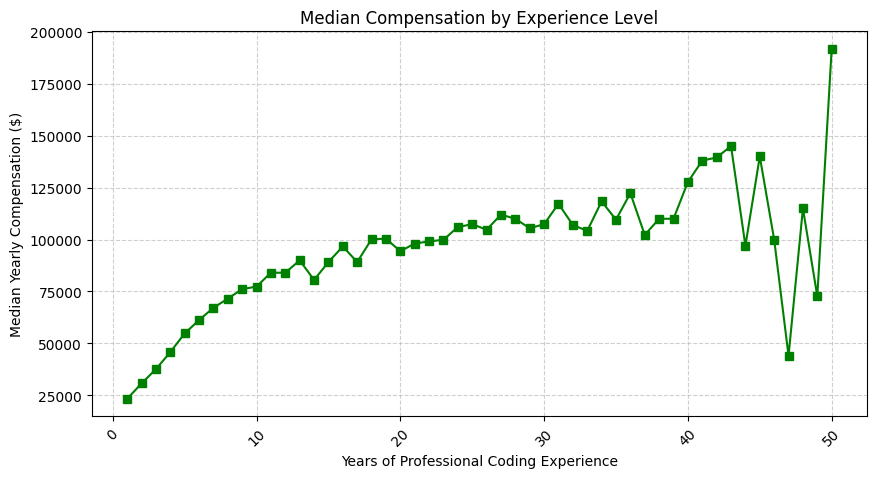

In [145]:
# Ensure experience column is numeric
df["YearsCodePro"] = pd.to_numeric(df["YearsCodePro"], errors="coerce")

# Group by experience level and compute median compensation
comp_by_exp = df.groupby("YearsCodePro")["ConvertedCompYearly"].median().dropna()

# Check if data exists
if not comp_by_exp.empty:
    # Plot line chart
    plt.figure(figsize=(10, 5))
    plt.plot(comp_by_exp.index, comp_by_exp.values, marker="s", linestyle="-", color="g")

    # Formatting
    plt.xlabel("Years of Professional Coding Experience")
    plt.ylabel("Median Yearly Compensation ($)")
    plt.title("Median Compensation by Experience Level")
    plt.xticks(rotation=45)
    plt.grid(True, linestyle="--", alpha=0.6)

    # Show plot
    plt.show()
else:
    print("No data available for Compensation by Experience.")


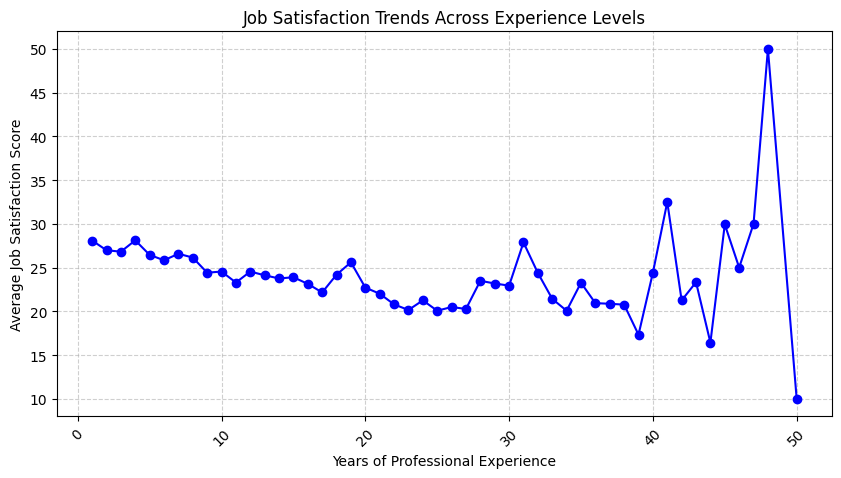

In [146]:
import pandas as pd
import matplotlib.pyplot as plt

# Ensure experience column is numeric
df["YearsCodePro"] = pd.to_numeric(df["YearsCodePro"], errors="coerce")

# Group by experience level and compute mean job satisfaction
job_sat_by_exp = df.groupby("YearsCodePro")["JobSatPoints_6"].mean().dropna()

# Check if data exists
if not job_sat_by_exp.empty:
    # Plot line chart
    plt.figure(figsize=(10, 5))
    plt.plot(job_sat_by_exp.index, job_sat_by_exp.values, marker="o", linestyle="-", color="b")

    # Formatting
    plt.xlabel("Years of Professional Experience")
    plt.ylabel("Average Job Satisfaction Score")
    plt.title("Job Satisfaction Trends Across Experience Levels")
    plt.xticks(rotation=45)
    plt.grid(True, linestyle="--", alpha=0.6)

    # Show plot
    plt.show()
else:
    print("No data available for Job Satisfaction by Experience.")


In [147]:
# Close the connection (optional)
conn.close()

BAR CHARTS


In [148]:
!pip install pandas

In [149]:
!pip install matplotlib

In [150]:
# Step 1: Download the dataset
!wget -O survey-data.csv https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/n01PQ9pSmiRX6520flujwQ/survey-data.csv

# Step 2: Import necessary libraries and load the dataset
import pandas as pd
import matplotlib.pyplot as plt

# Load the data
df = pd.read_csv("survey-data.csv")

# Display the first few rows to understand the structure of the data
df.head()

--2025-02-21 23:35:22--  https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/n01PQ9pSmiRX6520flujwQ/survey-data.csv
Resolving cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)... 169.63.118.104
Connecting to cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)|169.63.118.104|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 159525875 (152M) [text/csv]
Saving to: ‘survey-data.csv’

survey-data.csv     100%[===================>] 152.13M  73.2MB/s    in 2.1s    

2025-02-21 23:35:24 (73.2 MB/s) - ‘survey-data.csv’ saved [159525875/159525875]



,ResponseId,MainBranch,Age,Employment,RemoteWork,Check,CodingActivities,EdLevel,LearnCode,LearnCodeOnline,...,JobSatPoints_6,JobSatPoints_7,JobSatPoints_8,JobSatPoints_9,JobSatPoints_10,JobSatPoints_11,SurveyLength,SurveyEase,ConvertedCompYearly,JobSat
0,1,I am a developer by profession,Under 18 years old,"Employed, full-time",Remote,Apples,Hobby,Primary/elementary school,Books / Physical media,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,I am a developer by profession,35-44 years old,"Employed, full-time",Remote,Apples,Hobby;Contribute to open-source projects;Other...,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",Books / Physical media;Colleague;On the job tr...,Technical documentation;Blogs;Books;Written Tu...,...,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN
2,3,I am a developer by profession,45-54 years old,"Employed, full-time",Remote,Apples,Hobby;Contribute to open-source projects;Other...,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)",Books / Physical media;Colleague;On the job tr...,Technical documentation;Blogs;Books;Written Tu...,...,NaN,NaN,NaN,NaN,NaN,NaN,Appropriate in length,Easy,NaN,NaN
3,4,I am learning to code,18-24 years old,"Student, full-time",NaN,Apples,NaN,Some college/university study without earning ...,"Other online resources (e.g., videos, blogs, f...",Stack Overflow;How-to videos;Interactive tutorial,...,NaN,NaN,NaN,NaN,NaN,NaN,Too long,Easy,NaN,NaN
4,5,I am a developer by profession,18-24 years old,"Student, full-time",NaN,Apples,NaN,"Secondary school (e.g. American high school, G...","Other online resources (e.g., videos, blogs, f...",Technical documentation;Blogs;Written Tutorial...,...,NaN,NaN,NaN,NaN,NaN,NaN,Too short,Easy,NaN,NaN


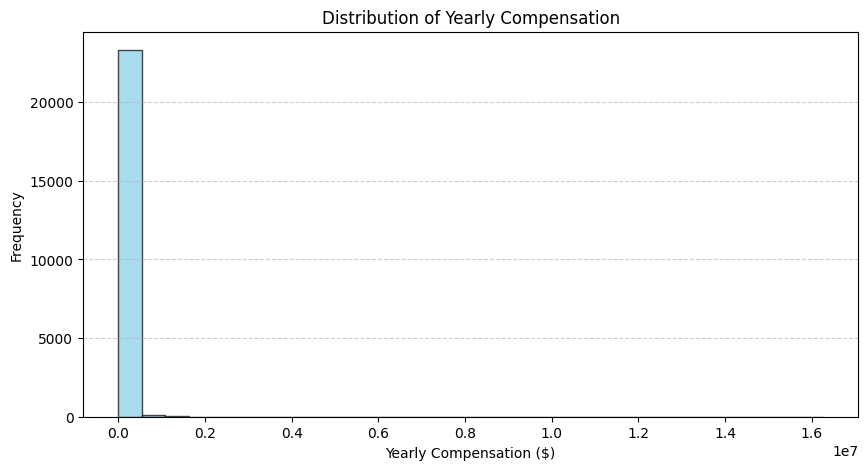

In [151]:
import pandas as pd
import matplotlib.pyplot as plt

# Drop missing values for compensation
df_filtered = df["ConvertedCompYearly"].dropna()

# Plot histogram
plt.figure(figsize=(10, 5))
plt.hist(df_filtered, bins=30, color="skyblue", edgecolor="black", alpha=0.7)

# Formatting
plt.xlabel("Yearly Compensation ($)")
plt.ylabel("Frequency")
plt.title("Distribution of Yearly Compensation")
plt.grid(axis="y", linestyle="--", alpha=0.6)

# Show plot
plt.show()


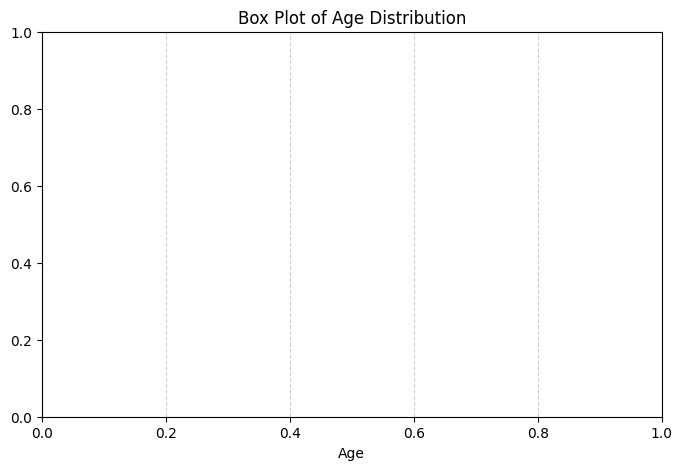

In [152]:
import seaborn as sns

# Convert Age to numeric, handling errors
df["Age"] = pd.to_numeric(df["Age"], errors="coerce")

# Drop NaN values for visualization
df_filtered_age = df["Age"].dropna()

# Plot box plot
plt.figure(figsize=(8, 5))
sns.boxplot(x=df_filtered_age, color="lightcoral")

# Formatting
plt.xlabel("Age")
plt.title("Box Plot of Age Distribution")
plt.grid(axis="x", linestyle="--", alpha=0.6)

# Show plot
plt.show()


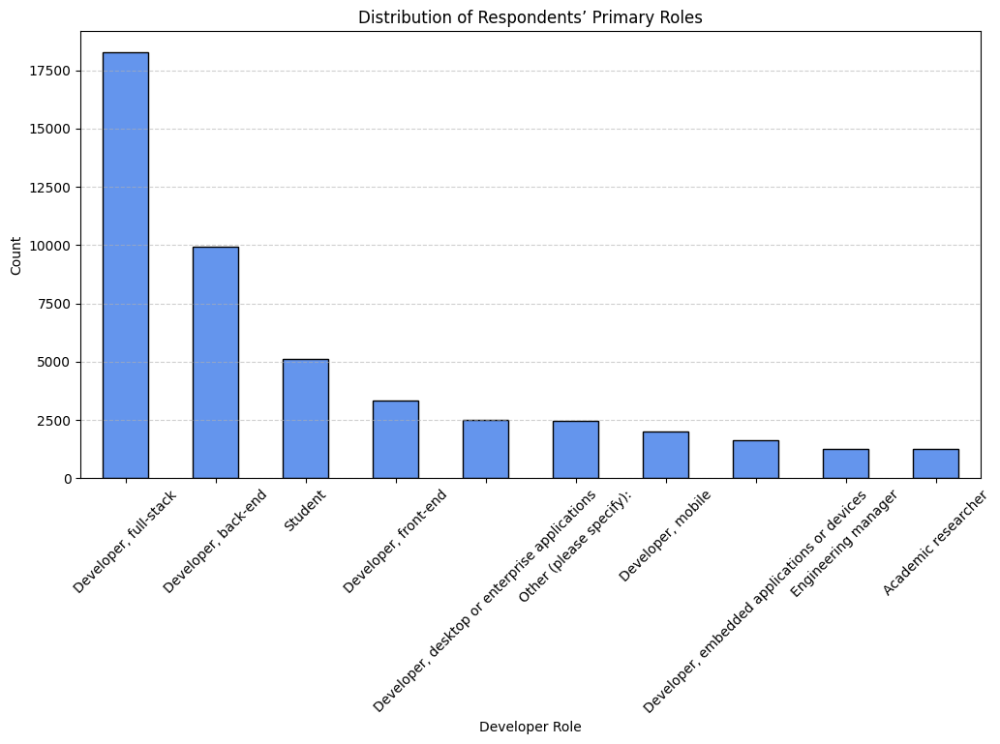

In [153]:
import pandas as pd
import matplotlib.pyplot as plt

# Count occurrences of each role
role_counts = df["DevType"].value_counts().head(10)  # Top 10 roles

# Plot bar chart
plt.figure(figsize=(12, 6))
role_counts.plot(kind="bar", color="cornflowerblue", edgecolor="black")

# Formatting
plt.xlabel("Developer Role")
plt.ylabel("Count")
plt.title("Distribution of Respondents’ Primary Roles")
plt.xticks(rotation=45)
plt.grid(axis="y", linestyle="--", alpha=0.6)

# Show plot
plt.show()


<ipython-input-154-1f75ed2a0dc1>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_languages.index, y=top_languages.values, palette="Blues_r")


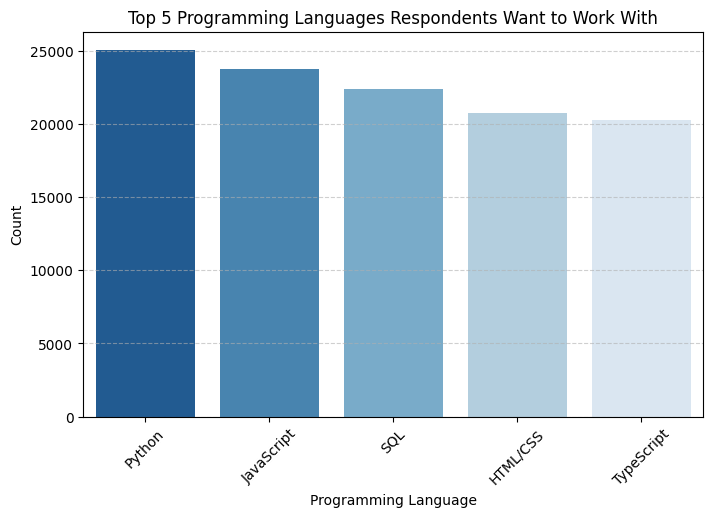

In [154]:
import seaborn as sns

# Count occurrences of each language
top_languages = df["LanguageWantToWorkWith"].str.split(";").explode().value_counts().head(5)

# Plot bar chart
plt.figure(figsize=(8, 5))
sns.barplot(x=top_languages.index, y=top_languages.values, palette="Blues_r")

# Formatting
plt.xlabel("Programming Language")
plt.ylabel("Count")
plt.title("Top 5 Programming Languages Respondents Want to Work With")
plt.xticks(rotation=45)
plt.grid(axis="y", linestyle="--", alpha=0.6)

# Show plot
plt.show()


In [156]:
# Group by Age and compute median job satisfaction, handling potential errors
job_sat_by_age = df.groupby("Age")[["JobSatPoints_6", "JobSatPoints_7"]].median()

# Check if job_sat_by_age is empty
if job_sat_by_age.empty:
    print("Error: No data available to create the stacked bar chart.")
else:
    # Plot stacked bar chart if data is available
    job_sat_by_age.plot(kind="bar", stacked=True, figsize=(12, 6), colormap="coolwarm", edgecolor="black")

    # Formatting
    plt.xlabel("Age Group")
    plt.ylabel("Median Job Satisfaction")
    plt.title("Stacked Bar Chart of Median Job Satisfaction by Age Group")
    plt.xticks(rotation=45)
    plt.legend(["JobSatPoints_6", "JobSatPoints_7"])
    plt.grid(axis="y", linestyle="--", alpha=0.6)

    # Show plot
    plt.show()

Error: No data available to create the stacked bar chart.


<ipython-input-157-b62c0d12d91b>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_databases.index, y=top_databases.values, palette="viridis")


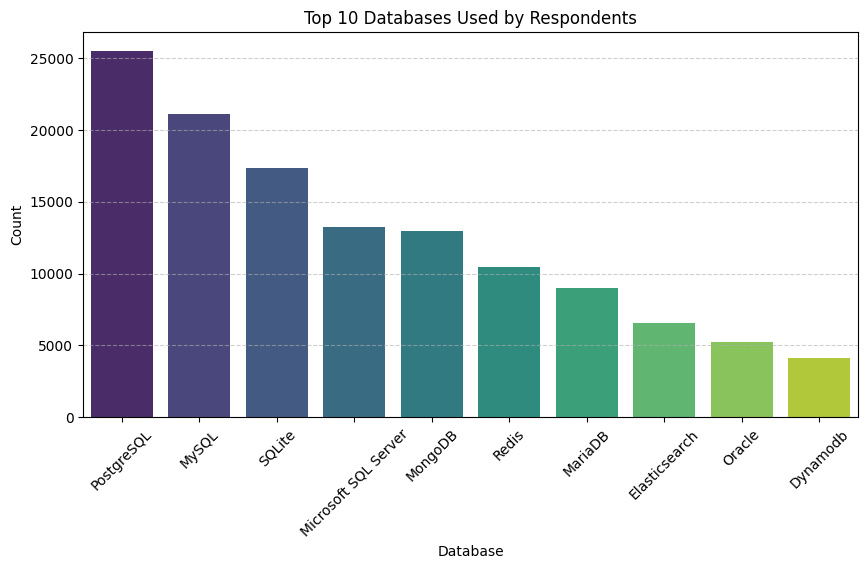

In [157]:
# Count occurrences of each database
top_databases = df["DatabaseHaveWorkedWith"].str.split(";").explode().value_counts().head(10)

# Plot bar chart
plt.figure(figsize=(10, 5))
sns.barplot(x=top_databases.index, y=top_databases.values, palette="viridis")

# Formatting
plt.xlabel("Database")
plt.ylabel("Count")
plt.title("Top 10 Databases Used by Respondents")
plt.xticks(rotation=45)
plt.grid(axis="y", linestyle="--", alpha=0.6)

# Show plot
plt.show()


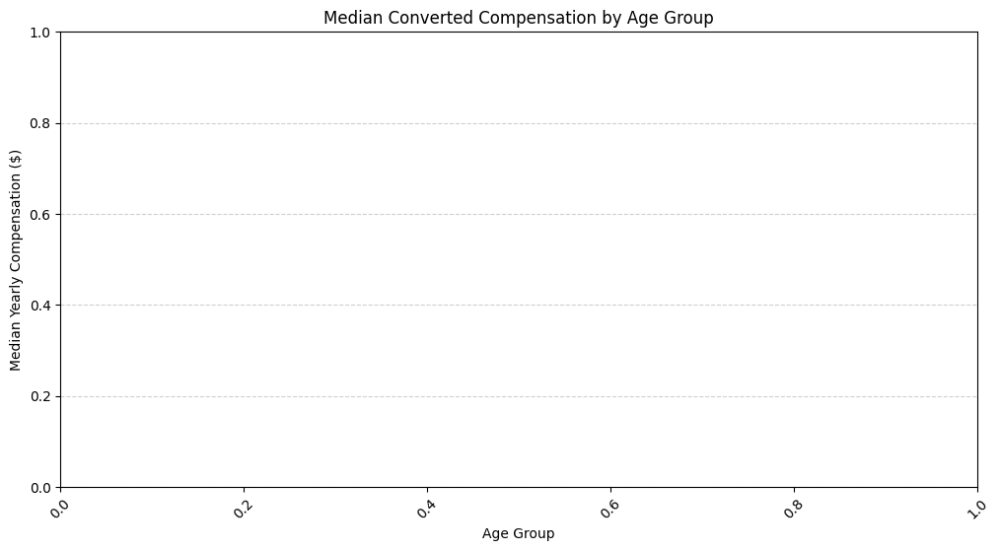

In [158]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Group by age and calculate median compensation
comp_by_age = df.groupby("Age")["ConvertedCompYearly"].median().dropna()

# Plot grouped bar chart
plt.figure(figsize=(12, 6))
sns.barplot(x=comp_by_age.index, y=comp_by_age.values, palette="coolwarm", edgecolor="black")

# Formatting
plt.xlabel("Age Group")
plt.ylabel("Median Yearly Compensation ($)")
plt.title("Median Converted Compensation by Age Group")
plt.xticks(rotation=45)
plt.grid(axis="y", linestyle="--", alpha=0.6)

# Show plot
plt.show()


<ipython-input-159-cbdec0f95068>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_countries.index, y=top_countries.values, palette="viridis")


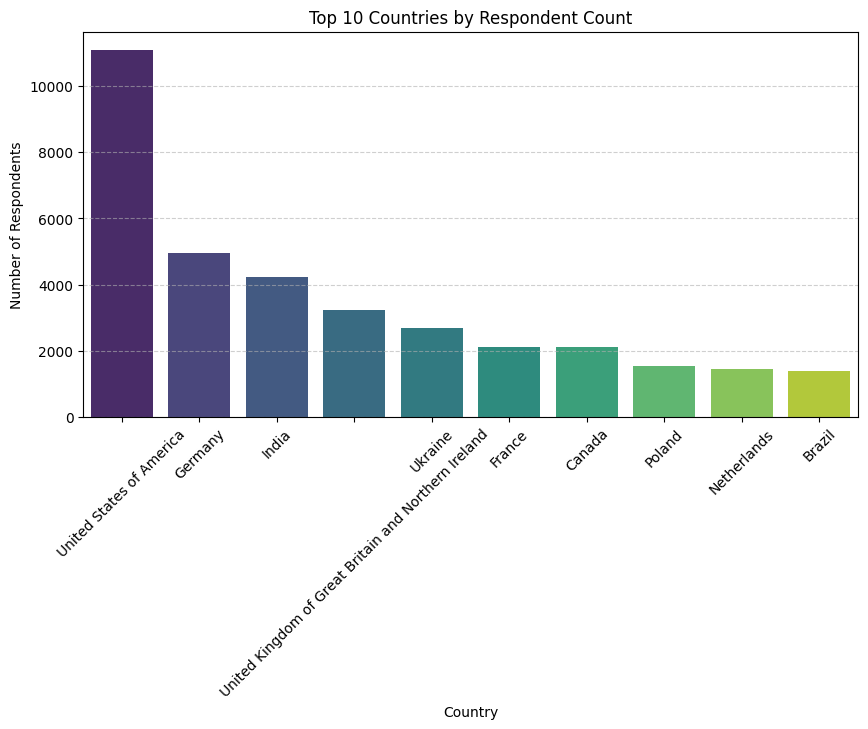

In [159]:
# Count respondents per country
top_countries = df["Country"].value_counts().head(10)  # Top 10 countries

# Plot bar chart
plt.figure(figsize=(10, 5))
sns.barplot(x=top_countries.index, y=top_countries.values, palette="viridis")

# Formatting
plt.xlabel("Country")
plt.ylabel("Number of Respondents")
plt.title("Top 10 Countries by Respondent Count")
plt.xticks(rotation=45)
plt.grid(axis="y", linestyle="--", alpha=0.6)

# Show plot
plt.show()
